In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>")) #makes the display bars longer and spread out 100% across the screen width

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 20)

#import xarray as xr
import warnings
warnings.filterwarnings('ignore')
from matplotlib.backends.backend_pdf import PdfPages

!whoami
!date

nicoly
Tue Jul 27 23:54:22 PDT 2021


# 2.3: WASTING (CAUSE validation after adding birth prevalence of wasting)

In [3]:
%cd /ihme/costeffectiveness/results/vivarium_ciff_sam/v2.3_wasting_birth_prevalence/ciff_sam/2021_07_26_17_14_31/count_data
%ls

/ihme/costeffectiveness/results/vivarium_ciff_sam/v2.3_wasting_birth_prevalence/ciff_sam/2021_07_26_17_14_31/count_data
deaths.csv                     population.csv                 ylds.csv
deaths.hdf                     population.hdf                 ylds.hdf
disease_state_person_time.csv  wasting_state_person_time.csv  ylls.csv
disease_state_person_time.hdf  wasting_state_person_time.hdf  ylls.hdf
disease_transition_count.csv   wasting_transition_count.csv
disease_transition_count.hdf   wasting_transition_count.hdf


In [4]:
#make directory to store outputs

#%mkdir /home/j/Project/simulation_science/ciff_malnutrition/verification_and_validation/v2.3_wasting_birth_prevalence

In [5]:
master_dir = '/home/j/Project/simulation_science/ciff_malnutrition/'
sim_result_dir = '/ihme/costeffectiveness/results/vivarium_ciff_sam/v2.3_wasting_birth_prevalence/ciff_sam/2021_07_26_17_14_31/count_data/' 
output_dir = master_dir + f'verification_and_validation/v2.3_wasting_birth_prevalence/'

In [6]:
deaths_explore = pd.read_csv(sim_result_dir + 'deaths.csv')
deaths_explore.cause.unique()

array(['diarrheal_diseases', 'lower_respiratory_infections', 'measles',
       'moderate_acute_malnutrition', 'other_causes',
       'severe_acute_malnutrition'], dtype=object)

In [7]:
deaths_explore.input_draw.nunique()

12

In [8]:
deaths_explore.input_draw.unique()

array([ 29, 223, 232, 357, 394, 524, 602, 629, 650, 680, 829, 946])

In [9]:
deaths_explore.sex.unique()

array(['female', 'male'], dtype=object)

In [10]:
deaths_explore.year.unique()

array([2022, 2023, 2024, 2025, 2026])

In [11]:
deaths_explore.age.unique()

array(['early_neonatal', 'late_neonatal', '1-5_months', '6-11_months',
       '12_to_23_months', '2_to_4'], dtype=object)

In [12]:
deaths_explore.head()

,Unnamed: 0,sex,year,cause,measure,input_draw,scenario,value,wasting_state,age
0,0,female,2022,diarrheal_diseases,death,29,baseline,1.0,susceptible_to_child_wasting,early_neonatal
1,1,female,2022,diarrheal_diseases,death,29,baseline,0.0,mild_child_wasting,early_neonatal
2,2,female,2022,diarrheal_diseases,death,29,baseline,0.0,moderate_acute_malnutrition,early_neonatal
3,3,female,2022,diarrheal_diseases,death,29,baseline,0.0,severe_acute_malnutrition,early_neonatal
4,4,female,2022,diarrheal_diseases,death,29,baseline,6.0,susceptible_to_child_wasting,late_neonatal


In [13]:
#check with rajan how people are born

pt_explore = pd.read_csv(sim_result_dir + 'population.csv')
pt_explore

,Unnamed: 0,measure,input_draw,scenario,value
0,0,total_population,29,baseline,1169038.0
1,1,total_population,223,baseline,1169805.0
2,2,total_population,232,baseline,1168973.0
3,3,total_population,357,baseline,1168712.0
4,4,total_population,394,baseline,1169436.0
...,...,...,...,...,...
55,55,total_population_untracked,629,baseline,0.0
56,56,total_population_untracked,650,baseline,0.0
57,57,total_population_untracked,680,baseline,0.0
58,58,total_population_untracked,829,baseline,0.0


In [14]:
pt_explore.groupby('measure').sum()

,Unnamed: 0,input_draw,value
measure,,,
total_population,66,6095,14028499.0
total_population_dead,210,6095,312250.0
total_population_living,354,6095,13716249.0
total_population_tracked,498,6095,14028499.0
total_population_untracked,642,6095,0.0


In [15]:
# and then this one is just time spend in each wasting state, not stratified on cause. 

wasting_pt_explore = pd.read_csv(sim_result_dir + 'wasting_state_person_time.csv')
wasting_pt_explore

,Unnamed: 0,sex,year,cause,measure,input_draw,scenario,value,age
0,0,female,2022,mild_child_wasting,state_person_time,29,baseline,67.629021,early_neonatal
1,1,female,2022,mild_child_wasting,state_person_time,29,baseline,242.324435,late_neonatal
2,2,female,2022,mild_child_wasting,state_person_time,29,baseline,3526.287474,1-5_months
3,3,female,2022,mild_child_wasting,state_person_time,29,baseline,8192.839151,6-11_months
4,4,female,2022,mild_child_wasting,state_person_time,29,baseline,20853.511294,12_to_23_months
...,...,...,...,...,...,...,...,...,...
2875,2875,male,2026,susceptible_to_child_wasting,state_person_time,946,baseline,635.219713,late_neonatal
2876,2876,male,2026,susceptible_to_child_wasting,state_person_time,946,baseline,4633.670089,1-5_months
2877,2877,male,2026,susceptible_to_child_wasting,state_person_time,946,baseline,5516.294319,6-11_months
2878,2878,male,2026,susceptible_to_child_wasting,state_person_time,946,baseline,11032.581793,12_to_23_months


-----------------------------------------------------------------------------------------------------------------------

In [16]:
# this one is showing sims who are, i.e., infected with diarrheal_diseases, and susceptible_to_child_wasting; most stratified person-time

disease_pt_explore = pd.read_csv(sim_result_dir + 'disease_state_person_time.csv')
disease_pt_explore

#6 ages, 2 sexes, 5 years, 6 causes, 4 wasting, 12 draws

,Unnamed: 0,sex,year,cause,measure,input_draw,scenario,value,wasting_state,age
0,0,female,2022,diarrheal_diseases,state_person_time,29,baseline,3.405886,susceptible_to_child_wasting,early_neonatal
1,1,female,2022,diarrheal_diseases,state_person_time,29,baseline,0.903491,mild_child_wasting,early_neonatal
2,2,female,2022,diarrheal_diseases,state_person_time,29,baseline,0.325804,moderate_acute_malnutrition,early_neonatal
3,3,female,2022,diarrheal_diseases,state_person_time,29,baseline,0.071184,severe_acute_malnutrition,early_neonatal
4,4,female,2022,diarrheal_diseases,state_person_time,29,baseline,24.869268,susceptible_to_child_wasting,late_neonatal
...,...,...,...,...,...,...,...,...,...,...
17275,17275,male,2026,susceptible_to_measles,state_person_time,946,baseline,299.448323,severe_acute_malnutrition,12_to_23_months
17276,17276,male,2026,susceptible_to_measles,state_person_time,946,baseline,40351.155373,susceptible_to_child_wasting,2_to_4
17277,17277,male,2026,susceptible_to_measles,state_person_time,946,baseline,13214.484600,mild_child_wasting,2_to_4
17278,17278,male,2026,susceptible_to_measles,state_person_time,946,baseline,4637.531828,moderate_acute_malnutrition,2_to_4


In [17]:
disease_pt_explore.cause.unique()

array(['diarrheal_diseases', 'lower_respiratory_infections', 'measles',
       'susceptible_to_diarrheal_diseases',
       'susceptible_to_lower_respiratory_infections',
       'susceptible_to_measles'], dtype=object)

In [18]:
total_pt = disease_pt_explore.value.sum()
total_pt

66505429.90143736

In [19]:
# looks like all 4x6 unique combos
disease_pt_explore[['cause','wasting_state']].drop_duplicates()

,cause,wasting_state
0,diarrheal_diseases,susceptible_to_child_wasting
1,diarrheal_diseases,mild_child_wasting
2,diarrheal_diseases,moderate_acute_malnutrition
3,diarrheal_diseases,severe_acute_malnutrition
288,lower_respiratory_infections,susceptible_to_child_wasting
...,...,...
1155,susceptible_to_lower_respiratory_infections,severe_acute_malnutrition
1440,susceptible_to_measles,susceptible_to_child_wasting
1441,susceptible_to_measles,mild_child_wasting
1442,susceptible_to_measles,moderate_acute_malnutrition


In [20]:
disease_pt_explore.year.unique()

array([2022, 2023, 2024, 2025, 2026])

In [21]:
disease_pt_explore.cause.unique()

array(['diarrheal_diseases', 'lower_respiratory_infections', 'measles',
       'susceptible_to_diarrheal_diseases',
       'susceptible_to_lower_respiratory_infections',
       'susceptible_to_measles'], dtype=object)

In [22]:
disease_pt_explore.wasting_state.unique()

array(['susceptible_to_child_wasting', 'mild_child_wasting',
       'moderate_acute_malnutrition', 'severe_acute_malnutrition'],
      dtype=object)

In [23]:
wasting_pt_explore.cause.unique()

array(['mild_child_wasting', 'moderate_acute_malnutrition',
       'severe_acute_malnutrition', 'susceptible_to_child_wasting'],
      dtype=object)

In [24]:
wasting_pt_explore

,Unnamed: 0,sex,year,cause,measure,input_draw,scenario,value,age
0,0,female,2022,mild_child_wasting,state_person_time,29,baseline,67.629021,early_neonatal
1,1,female,2022,mild_child_wasting,state_person_time,29,baseline,242.324435,late_neonatal
2,2,female,2022,mild_child_wasting,state_person_time,29,baseline,3526.287474,1-5_months
3,3,female,2022,mild_child_wasting,state_person_time,29,baseline,8192.839151,6-11_months
4,4,female,2022,mild_child_wasting,state_person_time,29,baseline,20853.511294,12_to_23_months
...,...,...,...,...,...,...,...,...,...
2875,2875,male,2026,susceptible_to_child_wasting,state_person_time,946,baseline,635.219713,late_neonatal
2876,2876,male,2026,susceptible_to_child_wasting,state_person_time,946,baseline,4633.670089,1-5_months
2877,2877,male,2026,susceptible_to_child_wasting,state_person_time,946,baseline,5516.294319,6-11_months
2878,2878,male,2026,susceptible_to_child_wasting,state_person_time,946,baseline,11032.581793,12_to_23_months


In [25]:
disease_pt_explore

,Unnamed: 0,sex,year,cause,measure,input_draw,scenario,value,wasting_state,age
0,0,female,2022,diarrheal_diseases,state_person_time,29,baseline,3.405886,susceptible_to_child_wasting,early_neonatal
1,1,female,2022,diarrheal_diseases,state_person_time,29,baseline,0.903491,mild_child_wasting,early_neonatal
2,2,female,2022,diarrheal_diseases,state_person_time,29,baseline,0.325804,moderate_acute_malnutrition,early_neonatal
3,3,female,2022,diarrheal_diseases,state_person_time,29,baseline,0.071184,severe_acute_malnutrition,early_neonatal
4,4,female,2022,diarrheal_diseases,state_person_time,29,baseline,24.869268,susceptible_to_child_wasting,late_neonatal
...,...,...,...,...,...,...,...,...,...,...
17275,17275,male,2026,susceptible_to_measles,state_person_time,946,baseline,299.448323,severe_acute_malnutrition,12_to_23_months
17276,17276,male,2026,susceptible_to_measles,state_person_time,946,baseline,40351.155373,susceptible_to_child_wasting,2_to_4
17277,17277,male,2026,susceptible_to_measles,state_person_time,946,baseline,13214.484600,mild_child_wasting,2_to_4
17278,17278,male,2026,susceptible_to_measles,state_person_time,946,baseline,4637.531828,moderate_acute_malnutrition,2_to_4


In [26]:
# shouldn't these be the same?

disease_pt_explore.loc[
    (disease_pt_explore.cause.isin(['diarrheal_diseases','susceptible_to_diarrheal_diseases']))].value.sum(), wasting_pt_explore.value.sum()

(22168476.633812457, 35205674.3175907)

In [113]:
# shouldn't these be the same?

disease_pt_explore.loc[
    (disease_pt_explore.cause.isin(['measles','susceptible_to_measles']))].value.sum(), wasting_pt_explore.value.sum()

(22168476.633812457, 35205674.3175907)

In [28]:
# shouldn't these be the same?

disease_pt_explore.loc[
    (disease_pt_explore.cause.isin(['lower_respiratory_infections','susceptible_to_lower_respiratory_infections']))].value.sum(), wasting_pt_explore.value.sum()

(22168476.633812457, 35205674.3175907)

In [29]:
total_pt

66505429.90143736

In [30]:
# these are the same... why isn't sum(disease)/3 == sum(wasting)?

id_cols = ['sex','year','age']
disease_pt_explore[id_cols].drop_duplicates().shape, wasting_pt_explore[id_cols].drop_duplicates().shape

((60, 3), (60, 3))

In [31]:
disease_transition_explore = pd.read_csv(sim_result_dir + 'disease_transition_count.csv')
disease_transition_explore

,Unnamed: 0,sex,year,measure,input_draw,scenario,value,wasting_state,age
0,0,female,2022,diarrheal_diseases_to_susceptible_to_diarrheal...,29,baseline,197.0,susceptible_to_child_wasting,early_neonatal
1,1,female,2022,diarrheal_diseases_to_susceptible_to_diarrheal...,29,baseline,46.0,mild_child_wasting,early_neonatal
2,2,female,2022,diarrheal_diseases_to_susceptible_to_diarrheal...,29,baseline,14.0,moderate_acute_malnutrition,early_neonatal
3,3,female,2022,diarrheal_diseases_to_susceptible_to_diarrheal...,29,baseline,8.0,severe_acute_malnutrition,early_neonatal
4,4,female,2022,diarrheal_diseases_to_susceptible_to_diarrheal...,29,baseline,1516.0,susceptible_to_child_wasting,late_neonatal
...,...,...,...,...,...,...,...,...,...
17275,17275,male,2026,susceptible_to_measles_to_measles_event_count,946,baseline,14.0,severe_acute_malnutrition,12_to_23_months
17276,17276,male,2026,susceptible_to_measles_to_measles_event_count,946,baseline,185.0,susceptible_to_child_wasting,2_to_4
17277,17277,male,2026,susceptible_to_measles_to_measles_event_count,946,baseline,58.0,mild_child_wasting,2_to_4
17278,17278,male,2026,susceptible_to_measles_to_measles_event_count,946,baseline,61.0,moderate_acute_malnutrition,2_to_4


In [32]:
disease_transition_explore.measure.unique()

array(['diarrheal_diseases_to_susceptible_to_diarrheal_diseases_event_count',
       'lower_respiratory_infections_to_susceptible_to_lower_respiratory_infections_event_count',
       'measles_to_susceptible_to_measles_event_count',
       'susceptible_to_diarrheal_diseases_to_diarrheal_diseases_event_count',
       'susceptible_to_lower_respiratory_infections_to_lower_respiratory_infections_event_count',
       'susceptible_to_measles_to_measles_event_count'], dtype=object)

In [33]:
wasting_transition_explore = pd.read_csv(sim_result_dir + 'wasting_transition_count.csv')
wasting_transition_explore

,Unnamed: 0,sex,year,measure,input_draw,scenario,value,age
0,0,female,2022,mild_child_wasting_to_moderate_acute_malnutrit...,29,baseline,218.0,early_neonatal
1,1,female,2022,mild_child_wasting_to_moderate_acute_malnutrit...,29,baseline,677.0,late_neonatal
2,2,female,2022,mild_child_wasting_to_moderate_acute_malnutrit...,29,baseline,11499.0,1-5_months
3,3,female,2022,mild_child_wasting_to_moderate_acute_malnutrit...,29,baseline,26814.0,6-11_months
4,4,female,2022,mild_child_wasting_to_moderate_acute_malnutrit...,29,baseline,59268.0,12_to_23_months
...,...,...,...,...,...,...,...,...
5035,5035,male,2026,susceptible_to_child_wasting_to_mild_child_was...,946,baseline,47.0,late_neonatal
5036,5036,male,2026,susceptible_to_child_wasting_to_mild_child_was...,946,baseline,479.0,1-5_months
5037,5037,male,2026,susceptible_to_child_wasting_to_mild_child_was...,946,baseline,674.0,6-11_months
5038,5038,male,2026,susceptible_to_child_wasting_to_mild_child_was...,946,baseline,1270.0,12_to_23_months


In [34]:
# yep this is everything expected
wasting_transition_explore.measure.unique()

array(['mild_child_wasting_to_moderate_acute_malnutrition_event_count',
       'mild_child_wasting_to_susceptible_to_child_wasting_event_count',
       'moderate_acute_malnutrition_to_mild_child_wasting_event_count',
       'moderate_acute_malnutrition_to_severe_acute_malnutrition_event_count',
       'severe_acute_malnutrition_to_mild_child_wasting_event_count',
       'severe_acute_malnutrition_to_moderate_acute_malnutrition_event_count',
       'susceptible_to_child_wasting_to_mild_child_wasting_event_count'],
      dtype=object)

# Sim results

In [35]:
def load_sim_count_data(sim_result_dir: str):
    columns = ['age', 'sex', 'year', 'input_draw', 'scenario', 'measure']
    df = {}
    fnames = ['deaths', 'disease_transition_count', 'wasting_transition_count',
              'disease_state_person_time', 'wasting_state_person_time']
    for fname in fnames:
        df[fname] = pd.read_csv(sim_result_dir + fname + '.csv', index_col=0)
         
        # get aggregated results if stratifications exist
        if 'cause' in df[fname].columns:
            df[fname] = df[fname].groupby(columns + ['cause']).value.sum().reset_index()
        else:
            df[fname] = df[fname].groupby(columns).value.sum().reset_index()
        
                                
    return df

In [36]:
df = load_sim_count_data(sim_result_dir)

In [37]:
df['deaths']

,age,sex,year,input_draw,scenario,measure,cause,value
0,1-5_months,female,2022,29,baseline,death,diarrheal_diseases,62.0
1,1-5_months,female,2022,29,baseline,death,lower_respiratory_infections,21.0
2,1-5_months,female,2022,29,baseline,death,measles,1.0
3,1-5_months,female,2022,29,baseline,death,moderate_acute_malnutrition,2.0
4,1-5_months,female,2022,29,baseline,death,other_causes,41.0
...,...,...,...,...,...,...,...,...
4315,late_neonatal,male,2026,946,baseline,death,lower_respiratory_infections,8.0
4316,late_neonatal,male,2026,946,baseline,death,measles,0.0
4317,late_neonatal,male,2026,946,baseline,death,moderate_acute_malnutrition,0.0
4318,late_neonatal,male,2026,946,baseline,death,other_causes,55.0


### DEATH counts 

In [38]:
#deaths

deaths_count_dd = df['deaths'].query('cause == "diarrheal_diseases"')
deaths_count_lri = df['deaths'].query('cause == "lower_respiratory_infections"')
deaths_count_msls = df['deaths'].query('cause == "measles"')

#PEM
deaths_count_am = df['deaths'].query('cause == "moderate_acute_malnutrition" | cause == "severe_acute_malnutrition"') #pem
deaths_count_am['cause'] = 'pem'
deaths_count_pem = deaths_count_am.groupby(['age', 'sex', 'year', 'input_draw', 'scenario', 'measure', 'cause']).value.sum().reset_index()

#others
deaths_count_others = df['deaths'].query('cause == "other_causes"')
#total
total_deaths_count = (df['deaths']
                     .groupby(['age', 'sex', 'year', 'input_draw', 'scenario', 'measure'])
                     .value.sum()
                     .reset_index())

total_deaths_count['cause'] = 'all_causes'

In [39]:
deaths_count_pem.head()

,age,sex,year,input_draw,scenario,measure,cause,value
0,1-5_months,female,2022,29,baseline,death,pem,2.0
1,1-5_months,female,2022,223,baseline,death,pem,9.0
2,1-5_months,female,2022,232,baseline,death,pem,7.0
3,1-5_months,female,2022,357,baseline,death,pem,4.0
4,1-5_months,female,2022,394,baseline,death,pem,8.0


In [40]:
deaths_count_msls.head()

,age,sex,year,input_draw,scenario,measure,cause,value
2,1-5_months,female,2022,29,baseline,death,measles,1.0
8,1-5_months,female,2022,223,baseline,death,measles,3.0
14,1-5_months,female,2022,232,baseline,death,measles,3.0
20,1-5_months,female,2022,357,baseline,death,measles,1.0
26,1-5_months,female,2022,394,baseline,death,measles,0.0


### cause incidence counts

In [41]:
df['disease_transition_count'].measure.unique()

array(['diarrheal_diseases_to_susceptible_to_diarrheal_diseases_event_count',
       'lower_respiratory_infections_to_susceptible_to_lower_respiratory_infections_event_count',
       'measles_to_susceptible_to_measles_event_count',
       'susceptible_to_diarrheal_diseases_to_diarrheal_diseases_event_count',
       'susceptible_to_lower_respiratory_infections_to_lower_respiratory_infections_event_count',
       'susceptible_to_measles_to_measles_event_count'], dtype=object)

In [42]:
#incidence counts 

#incident cases of diarrheal diseases: S to diarrhea
incidence_dd_count = (df['disease_transition_count'].query('measure == "susceptible_to_diarrheal_diseases_to_diarrheal_diseases_event_count"'))
incidence_dd_count['cause'] = 'diarrheal_disease'
incidence_dd_count['measure'] = 'incidence'

#incident cases of lri: S to LRI
incidence_lri_count = (df['disease_transition_count'].query('measure == "susceptible_to_lower_respiratory_infections_to_lower_respiratory_infections_event_count"'))
incidence_lri_count['cause'] = 'lri'
incidence_lri_count['measure'] = 'incidence'

#incident cases of lri: S to measles
incidence_msls_count = (df['disease_transition_count'].query('measure == "susceptible_to_measles_to_measles_event_count"'))
incidence_msls_count['cause'] = 'measles'
incidence_msls_count['measure'] = 'incidence'


In [43]:
# remission counts 

#incident cases of diarrheal diseases: S to diarrhea
remission_dd_count = (df['disease_transition_count']
                      .query('measure == "diarrheal_diseases_to_susceptible_to_diarrheal_diseases_event_count"'))
remission_dd_count['cause'] = 'diarrheal_disease'
remission_dd_count['measure'] = 'remission'

#incident cases of lri: S to LRIb
remission_lri_count = (df['disease_transition_count']
                      .query('measure == "lower_respiratory_infections_to_susceptible_to_lower_respiratory_infections_event_count"'))
remission_lri_count['cause'] = 'lri'
remission_lri_count['measure'] = 'remission'

#incident cases of lri: S to measles
remission_msls_count = (df['disease_transition_count']
                      .query('measure == "measles_to_susceptible_to_measles_event_count"'))
remission_msls_count['cause'] = 'measles'
remission_msls_count['measure'] = 'remission'


### disease state person-time

In [44]:
df['disease_state_person_time'].cause.unique()

array(['diarrheal_diseases', 'lower_respiratory_infections', 'measles',
       'susceptible_to_diarrheal_diseases',
       'susceptible_to_lower_respiratory_infections',
       'susceptible_to_measles'], dtype=object)

In [45]:
df['wasting_state_person_time'].cause.unique()

array(['mild_child_wasting', 'moderate_acute_malnutrition',
       'severe_acute_malnutrition', 'susceptible_to_child_wasting'],
      dtype=object)

In [46]:
#WITH CONDITION
person_time_dd = df['disease_state_person_time'].query('cause == "diarrheal_diseases"')
person_time_lri = df['disease_state_person_time'].query('cause == "lower_respiratory_infections"')
person_time_msls = df['disease_state_person_time'].query('cause == "measles"')

#SUSCEPTIBLE 
person_time_sus_dd = df['disease_state_person_time'].query('cause == "susceptible_to_diarrheal_diseases"')
person_time_sus_lri = df['disease_state_person_time'].query('cause == "susceptible_to_lower_respiratory_infections"')
person_time_sus_msls = df['disease_state_person_time'].query('cause == "susceptible_to_measles"')



#person_time_pc['measure'] = 'prevalence'
#person_time_c['measure'] = 'prevalence'

In [47]:
person_time_sus_msls 

,age,sex,year,input_draw,scenario,measure,cause,value
5,1-5_months,female,2022,29,baseline,state_person_time,susceptible_to_measles,11074.016427
11,1-5_months,female,2022,223,baseline,state_person_time,susceptible_to_measles,11031.047228
17,1-5_months,female,2022,232,baseline,state_person_time,susceptible_to_measles,10975.906913
23,1-5_months,female,2022,357,baseline,state_person_time,susceptible_to_measles,10995.843943
29,1-5_months,female,2022,394,baseline,state_person_time,susceptible_to_measles,10948.707734
...,...,...,...,...,...,...,...,...
4295,late_neonatal,male,2026,629,baseline,state_person_time,susceptible_to_measles,606.882957
4301,late_neonatal,male,2026,650,baseline,state_person_time,susceptible_to_measles,608.449008
4307,late_neonatal,male,2026,680,baseline,state_person_time,susceptible_to_measles,616.632444
4313,late_neonatal,male,2026,829,baseline,state_person_time,susceptible_to_measles,618.551677


In [48]:
#PEM -WITH CONDITION
person_time_am = df['wasting_state_person_time'].query('cause == "moderate_acute_malnutrition" | cause == "severe_acute_malnutrition"')
person_time_am['cause'] = 'pem'
person_time_pem = person_time_am.groupby(['age', 'sex', 'year', 'input_draw', 'scenario', 'measure', 'cause']).value.sum().reset_index()


#PEM - SUSCEPTIBLE (using TMREL + MILD as the susceptible pool...which is consistent with GBD susceptible to PEM pool)
person_time_sus_am = df['wasting_state_person_time'].query('cause == "susceptible_to_child_wasting" | cause == "mild_child_wasting"')
person_time_sus_am['cause'] = 'susceptible_to_pem'
person_time_sus_pem = person_time_sus_am.groupby(['age', 'sex', 'year', 'input_draw', 'scenario', 'measure', 'cause']).value.sum().reset_index()
#person_time_sus_pem.head()

In [49]:
person_time_pem.head() #720 rows

,age,sex,year,input_draw,scenario,measure,cause,value
0,1-5_months,female,2022,29,baseline,state_person_time,pem,1773.957563
1,1-5_months,female,2022,223,baseline,state_person_time,pem,1851.523614
2,1-5_months,female,2022,232,baseline,state_person_time,pem,1794.010951
3,1-5_months,female,2022,357,baseline,state_person_time,pem,1802.587269
4,1-5_months,female,2022,394,baseline,state_person_time,pem,1781.138946


In [50]:
person_time_sus_pem.head() #720 rows

,age,sex,year,input_draw,scenario,measure,cause,value
0,1-5_months,female,2022,29,baseline,state_person_time,susceptible_to_pem,15807.300479
1,1-5_months,female,2022,223,baseline,state_person_time,susceptible_to_pem,15660.271047
2,1-5_months,female,2022,232,baseline,state_person_time,susceptible_to_pem,15506.585900
3,1-5_months,female,2022,357,baseline,state_person_time,susceptible_to_pem,15635.921971
4,1-5_months,female,2022,394,baseline,state_person_time,susceptible_to_pem,15661.177276


In [51]:
## add total person time
df['person_time'] = df['disease_state_person_time'].loc[
    df['disease_state_person_time'].cause.isin(['diarrheal_diseases','susceptible_to_diarrheal_diseases'])
].groupby(['age','sex','year','input_draw','scenario','measure']).sum().reset_index()

df['person_time']['cause'] = 'all_causes'

In [115]:
df['person_time'].value.sum()

22168476.633812454

In [52]:
deaths_explore.age.unique()

array(['early_neonatal', 'late_neonatal', '1-5_months', '6-11_months',
       '12_to_23_months', '2_to_4'], dtype=object)

In [53]:
def get_measure(data: pd.DataFrame):
    """
    rate per PY among source population
    note the numerator is 'data' and denominator is df['person_time']
    """
    
    result = ((data
               .set_index(['age', 'sex', 'year', 'input_draw', 'scenario', 'measure', 'cause'])
               .div(df['person_time'].drop(columns=['measure','cause'])                                 #total person time as denominator
                    .set_index(['age', 'sex', 'year', 'input_draw', 'scenario'])))
              .reset_index())
    
    result['age_group'] = np.where(result['age'] == 'early_neonatal', 1,
                              np.where(result['age'] == 'late_neonatal', 2,
                                       np.where(result['age'] == '1-5_months',3,
                                                np.where(result['age'] == '6-11_months',4,
                                                         np.where(result['age'] == '12_to_23_months',5,
                                                         6)))))
    
    result_summary = (result
                      .groupby(['age_group', 'sex', 'year', 'scenario', 'measure', 'cause'])
                      .value.describe(percentiles=[.025, .975])
                      .filter(['mean', '2.5%', '97.5%'])
                      .reset_index())
    
    return result_summary

### ACMR and CSMR

In [54]:
# deaths acmr + csmr

acmr = get_measure(total_deaths_count)
deaths_dd = get_measure(deaths_count_dd)
deaths_lri = get_measure(deaths_count_lri)
deaths_msls = get_measure(deaths_count_msls)
deaths_pem = get_measure(deaths_count_pem)
deaths_other = get_measure(deaths_count_others)

In [55]:
deaths_pem

,age_group,sex,year,scenario,measure,cause,mean,2.5%,97.5%
0,1,female,2022,baseline,death,pem,0.000000,0.000000,0.000000
1,1,female,2023,baseline,death,pem,0.000000,0.000000,0.000000
2,1,female,2024,baseline,death,pem,0.000000,0.000000,0.000000
3,1,female,2025,baseline,death,pem,0.000000,0.000000,0.000000
4,1,female,2026,baseline,death,pem,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...
55,6,male,2022,baseline,death,pem,0.000170,0.000117,0.000247
56,6,male,2023,baseline,death,pem,0.000187,0.000131,0.000248
57,6,male,2024,baseline,death,pem,0.000175,0.000100,0.000274
58,6,male,2025,baseline,death,pem,0.000197,0.000149,0.000264


In [56]:
deaths_dd.age_group.unique()

array([1, 2, 3, 4, 5, 6])

# PREVALENCE
#### 'prevalence' = 'infected_person_time' / 'person_time'


In [57]:
df['person_time'].age.nunique() * \
df['person_time'].sex.nunique() * \
df['person_time'].year.nunique() * \
df['person_time'].input_draw.nunique()


720

In [58]:
person_time_dd.shape, df['person_time'].shape

((720, 8), (720, 8))

In [59]:
#denominator

df['person_time'] #720 rows

,age,sex,year,input_draw,scenario,measure,value,cause
0,1-5_months,female,2022,29,baseline,state_person_time,11078.171116,all_causes
1,1-5_months,female,2022,223,baseline,state_person_time,11038.098563,all_causes
2,1-5_months,female,2022,232,baseline,state_person_time,10985.052704,all_causes
3,1-5_months,female,2022,357,baseline,state_person_time,11000.939083,all_causes
4,1-5_months,female,2022,394,baseline,state_person_time,10951.062286,all_causes
...,...,...,...,...,...,...,...,...
715,late_neonatal,male,2026,629,baseline,state_person_time,606.882957,all_causes
716,late_neonatal,male,2026,650,baseline,state_person_time,608.449008,all_causes
717,late_neonatal,male,2026,680,baseline,state_person_time,616.632444,all_causes
718,late_neonatal,male,2026,829,baseline,state_person_time,618.551677,all_causes


In [60]:
# cause prevalence
prevalence_dd = get_measure(person_time_dd)
prevalence_lri = get_measure(person_time_lri)
prevalence_msls = get_measure(person_time_msls)
prevalence_pem = get_measure(person_time_pem)

In [112]:
person_time_pem

,age,sex,year,input_draw,scenario,measure,cause,value
0,1-5_months,female,2022,29,baseline,state_person_time,pem,1773.957563
1,1-5_months,female,2022,223,baseline,state_person_time,pem,1851.523614
2,1-5_months,female,2022,232,baseline,state_person_time,pem,1794.010951
3,1-5_months,female,2022,357,baseline,state_person_time,pem,1802.587269
4,1-5_months,female,2022,394,baseline,state_person_time,pem,1781.138946
...,...,...,...,...,...,...,...,...
715,late_neonatal,male,2026,629,baseline,state_person_time,pem,131.905544
716,late_neonatal,male,2026,650,baseline,state_person_time,pem,133.015743
717,late_neonatal,male,2026,680,baseline,state_person_time,pem,131.134839
718,late_neonatal,male,2026,829,baseline,state_person_time,pem,129.514031


In [61]:
prevalence_pem

,age_group,sex,year,scenario,measure,cause,mean,2.5%,97.5%
0,1,female,2022,baseline,state_person_time,pem,0.158132,0.149844,0.167769
1,1,female,2023,baseline,state_person_time,pem,0.157544,0.148214,0.167420
2,1,female,2024,baseline,state_person_time,pem,0.157327,0.149305,0.166462
3,1,female,2025,baseline,state_person_time,pem,0.158219,0.147390,0.169662
4,1,female,2026,baseline,state_person_time,pem,0.157586,0.148574,0.170851
...,...,...,...,...,...,...,...,...,...
55,6,male,2022,baseline,state_person_time,pem,0.139044,0.132121,0.145303
56,6,male,2023,baseline,state_person_time,pem,0.144724,0.138632,0.150688
57,6,male,2024,baseline,state_person_time,pem,0.146396,0.140552,0.151233
58,6,male,2025,baseline,state_person_time,pem,0.146399,0.140074,0.151706


In [109]:
prevalence_pem.age_group.unique()

array([1, 2, 3, 4, 5, 6])

# CAUSE INCIDENCE 

In [62]:
#numerator: incidence_{cause}_count
incidence_dd_count
incidence_lri_count
incidence_msls_count

,age,sex,year,input_draw,scenario,measure,value,cause
5,1-5_months,female,2022,29,baseline,incidence,156.0,measles
11,1-5_months,female,2022,223,baseline,incidence,260.0,measles
17,1-5_months,female,2022,232,baseline,incidence,348.0,measles
23,1-5_months,female,2022,357,baseline,incidence,187.0,measles
29,1-5_months,female,2022,394,baseline,incidence,86.0,measles
...,...,...,...,...,...,...,...,...
4295,late_neonatal,male,2026,629,baseline,incidence,0.0,measles
4301,late_neonatal,male,2026,650,baseline,incidence,0.0,measles
4307,late_neonatal,male,2026,680,baseline,incidence,0.0,measles
4313,late_neonatal,male,2026,829,baseline,incidence,0.0,measles


In [63]:
incidence_msls_count.age.unique()

array(['1-5_months', '12_to_23_months', '2_to_4', '6-11_months',
       'early_neonatal', 'late_neonatal'], dtype=object)

In [64]:
#denominator
person_time_sus_dd = df['disease_state_person_time'].query('cause == "susceptible_to_diarrheal_diseases"')
person_time_sus_lri = df['disease_state_person_time'].query('cause == "susceptible_to_lower_respiratory_infections"')
person_time_sus_msls = df['disease_state_person_time'].query('cause == "susceptible_to_measles"')


In [65]:
def get_transition(data_numerator: pd.DataFrame, data_denominator: pd.DataFrame):
    # rate per PY among source population
    
    result = (data_numerator.set_index(['age', 'sex', 'year', 'input_draw', 'scenario', 'measure', 'cause'])
              .div(data_denominator.drop(columns='measure').drop(columns='cause').set_index(['age', 'sex', 'year', 'input_draw', 'scenario']))
              .reset_index())
    
    result['age_group'] = np.where(result['age'] == 'early_neonatal', 1,
                              np.where(result['age'] == 'late_neonatal', 2,
                                       np.where(result['age'] == '1-5_months',3,
                                                np.where(result['age'] == '6-11_months',4,
                                                         np.where(result['age'] == '12_to_23_months',5,
                                                         6)))))
    result_summary = (result
                      .groupby(['age_group','sex', 'year', 'scenario', 'measure','cause'])
                      .value.describe(percentiles=[.025, .975])
                      .filter(['mean', '2.5%', '97.5%'])
                      .reset_index())
    
    return result_summary

In [66]:
# incidence
incidence_dd = get_transition(incidence_dd_count, person_time_sus_dd)
incidence_lri = get_transition(incidence_lri_count, person_time_sus_lri )
incidence_msls = get_transition(incidence_msls_count, person_time_sus_msls)

In [67]:
incidence_msls.head()

,age_group,sex,year,scenario,measure,cause,mean,2.5%,97.5%
0,1,female,2022,baseline,incidence,measles,0.0,0.0,0.0
1,1,female,2023,baseline,incidence,measles,0.0,0.0,0.0
2,1,female,2024,baseline,incidence,measles,0.0,0.0,0.0
3,1,female,2025,baseline,incidence,measles,0.0,0.0,0.0
4,1,female,2026,baseline,incidence,measles,0.0,0.0,0.0


In [68]:
incidence_msls.age_group.unique() 

array([1, 2, 3, 4, 5, 6])

# CAUSE REMISSION

In [69]:
# remission
remission_dd = get_transition(remission_dd_count, person_time_dd)
remission_lri = get_transition(remission_lri_count, person_time_lri )
remission_msls = get_transition(remission_msls_count, person_time_msls)

In [70]:
remission_msls

,age_group,sex,year,scenario,measure,cause,mean,2.5%,97.5%
0,1,female,2022,baseline,remission,measles,NaN,NaN,NaN
1,1,female,2023,baseline,remission,measles,NaN,NaN,NaN
2,1,female,2024,baseline,remission,measles,NaN,NaN,NaN
3,1,female,2025,baseline,remission,measles,NaN,NaN,NaN
4,1,female,2026,baseline,remission,measles,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
55,6,male,2022,baseline,remission,measles,36.500248,35.752598,37.491836
56,6,male,2023,baseline,remission,measles,36.467364,35.950676,37.553987
57,6,male,2024,baseline,remission,measles,36.500879,35.456053,37.278738
58,6,male,2025,baseline,remission,measles,36.108525,35.194965,36.838100


# EXCESS MORTALITY RATE
#### 'excess_mortality_rate' = 'deaths from cause' / 'infected_person_time'

In [71]:
def get_emr(data_numerator: pd.DataFrame, data_denominator: pd.DataFrame):
    # rate per PY among source population
    
    result = (data_numerator.set_index(['age', 'sex', 'year', 'input_draw', 'scenario', 'measure', 'cause'])
              .div(data_denominator.drop(columns='measure').drop(columns='cause').set_index(['age', 'sex', 'year', 'input_draw', 'scenario']))
              .reset_index())
    
    #print(data_numerator)
    #print(data_denominator)
    
    result['age_group'] = np.where(result['age'] == 'early_neonatal', 1,
                              np.where(result['age'] == 'late_neonatal', 2,
                                       np.where(result['age'] == '1-5_months',3,
                                                np.where(result['age'] == '6-11_months',4,
                                                         np.where(result['age'] == '12_to_23_months',5,
                                                         6)))))
     
    result_summary = (result
                      .groupby(['age_group', 'sex', 'year', 'scenario', 'measure','cause'])
                      .value.describe(percentiles=[.025, .975])
                      .filter(['mean', '2.5%', '97.5%'])
                      .reset_index())
    
    return result_summary

In [72]:
emr_dd = get_emr(deaths_count_dd, person_time_dd)
emr_lri = get_emr(deaths_count_lri, person_time_lri)
emr_msls = get_emr(deaths_count_msls, person_time_msls)
emr_pem = get_emr(deaths_count_pem, person_time_pem)

In [73]:
person_time_msls

,age,sex,year,input_draw,scenario,measure,cause,value
2,1-5_months,female,2022,29,baseline,state_person_time,measles,4.154689
8,1-5_months,female,2022,223,baseline,state_person_time,measles,7.051335
14,1-5_months,female,2022,232,baseline,state_person_time,measles,9.145791
20,1-5_months,female,2022,357,baseline,state_person_time,measles,5.095140
26,1-5_months,female,2022,394,baseline,state_person_time,measles,2.354552
...,...,...,...,...,...,...,...,...
4292,late_neonatal,male,2026,629,baseline,state_person_time,measles,0.000000
4298,late_neonatal,male,2026,650,baseline,state_person_time,measles,0.000000
4304,late_neonatal,male,2026,680,baseline,state_person_time,measles,0.000000
4310,late_neonatal,male,2026,829,baseline,state_person_time,measles,0.000000


In [74]:
emr_pem

,age_group,sex,year,scenario,measure,cause,mean,2.5%,97.5%
0,1,female,2022,baseline,death,pem,0.000000,0.000000,0.000000
1,1,female,2023,baseline,death,pem,0.000000,0.000000,0.000000
2,1,female,2024,baseline,death,pem,0.000000,0.000000,0.000000
3,1,female,2025,baseline,death,pem,0.000000,0.000000,0.000000
4,1,female,2026,baseline,death,pem,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...
55,6,male,2022,baseline,death,pem,0.001228,0.000851,0.001733
56,6,male,2023,baseline,death,pem,0.001295,0.000895,0.001754
57,6,male,2024,baseline,death,pem,0.001194,0.000672,0.001852
58,6,male,2025,baseline,death,pem,0.001345,0.000983,0.001773


In [75]:
person_time_msls[person_time_msls['age'] == 'late_neonatal'].head()

,age,sex,year,input_draw,scenario,measure,cause,value
3602,late_neonatal,female,2022,29,baseline,state_person_time,measles,0.0
3608,late_neonatal,female,2022,223,baseline,state_person_time,measles,0.0
3614,late_neonatal,female,2022,232,baseline,state_person_time,measles,0.0
3620,late_neonatal,female,2022,357,baseline,state_person_time,measles,0.0
3626,late_neonatal,female,2022,394,baseline,state_person_time,measles,0.0


In [76]:
deaths_count_msls[deaths_count_msls['age'] == 'late_neonatal'].head()

,age,sex,year,input_draw,scenario,measure,cause,value
3602,late_neonatal,female,2022,29,baseline,death,measles,0.0
3608,late_neonatal,female,2022,223,baseline,death,measles,0.0
3614,late_neonatal,female,2022,232,baseline,death,measles,0.0
3620,late_neonatal,female,2022,357,baseline,death,measles,0.0
3626,late_neonatal,female,2022,394,baseline,death,measles,0.0


In [77]:
emr_msls

,age_group,sex,year,scenario,measure,cause,mean,2.5%,97.5%
0,1,female,2022,baseline,death,measles,NaN,NaN,NaN
1,1,female,2023,baseline,death,measles,NaN,NaN,NaN
2,1,female,2024,baseline,death,measles,NaN,NaN,NaN
3,1,female,2025,baseline,death,measles,NaN,NaN,NaN
4,1,female,2026,baseline,death,measles,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
55,6,male,2022,baseline,death,measles,0.461475,0.299533,0.627839
56,6,male,2023,baseline,death,measles,0.424553,0.204112,0.616447
57,6,male,2024,baseline,death,measles,0.436382,0.268783,0.725298
58,6,male,2025,baseline,death,measles,0.458665,0.238447,0.836220


In [78]:
emr_msls.age_group.unique() 

array([1, 2, 3, 4, 5, 6])

# ARTIFACT

In [79]:
#filepath

%cd /ihme/costeffectiveness/artifacts/vivarium_ciff_sam/
%ls

/ihme/costeffectiveness/artifacts/vivarium_ciff_sam
backup-2.hdf  backup.hdf  ethiopia.hdf


In [80]:
from vivarium import Artifact

#explore the artifact data (note age groups)
art = Artifact('/ihme/costeffectiveness/artifacts/vivarium_ciff_sam/ethiopia.hdf', filter_terms=['year_start == 2019', 'age_start >=  0', f'age_end <= 5'])

In [81]:
art.keys

['metadata.keyspace',
 'metadata.locations',
 'population.location',
 'population.structure',
 'population.age_bins',
 'population.demographic_dimensions',
 'population.theoretical_minimum_risk_life_expectancy',
 'cause.all_causes.cause_specific_mortality_rate',
 'covariate.live_births_by_sex.estimate',
 'cause.diarrheal_diseases.prevalence',
 'cause.diarrheal_diseases.incidence_rate',
 'cause.diarrheal_diseases.remission_rate',
 'cause.diarrheal_diseases.disability_weight',
 'cause.diarrheal_diseases.excess_mortality_rate',
 'cause.diarrheal_diseases.cause_specific_mortality_rate',
 'cause.diarrheal_diseases.restrictions',
 'cause.measles.prevalence',
 'cause.measles.incidence_rate',
 'cause.measles.disability_weight',
 'cause.measles.excess_mortality_rate',
 'cause.measles.cause_specific_mortality_rate',
 'cause.measles.restrictions',
 'cause.lower_respiratory_infections.prevalence',
 'cause.lower_respiratory_infections.incidence_rate',
 'cause.lower_respiratory_infections.remission_

In [82]:
print(art)

Artifact containing the following keys:
metadata
	keyspace
	locations
population
	location
	structure
	age_bins
	demographic_dimensions
	theoretical_minimum_risk_life_expectancy
cause
	all_causes
		cause_specific_mortality_rate
	diarrheal_diseases
		prevalence
		incidence_rate
		remission_rate
		disability_weight
		excess_mortality_rate
		cause_specific_mortality_rate
		restrictions
	measles
		prevalence
		incidence_rate
		disability_weight
		excess_mortality_rate
		cause_specific_mortality_rate
		restrictions
	lower_respiratory_infections
		prevalence
		incidence_rate
		remission_rate
		disability_weight
		excess_mortality_rate
		cause_specific_mortality_rate
		restrictions
	protein_energy_malnutrition
		excess_mortality_rate
		cause_specific_mortality_rate
		restrictions
covariate
	live_births_by_sex
		estimate
sequela
	moderate_acute_malnutrition
		disability_weight
	severe_acute_malnutrition
		disability_weight
risk_factor
	child_wasting
		distribution
		categories
		exposure
		rel

In [83]:
#explore the artifact data (note age groups)
art = Artifact('/ihme/costeffectiveness/artifacts/vivarium_ciff_sam/ethiopia.hdf', filter_terms=['year_start == 2019', 'age_start <5', f'age_end <= 5'])

In [84]:
art.load('risk_factor.child_wasting.exposure')

draw_0    draw_1  \
sex    age_start age_end  year_start year_end parameter                       
Female 0.000000  0.019178 2019       2020     cat1       0.025542  0.022101   
                                              cat2       0.084023  0.079775   
                                              cat3       0.202135  0.203205   
                                              cat4       0.688300  0.694919   
       0.019178  0.076712 2019       2020     cat1       0.024107  0.025712   
...                                                           ...       ...   
Male   1.000000  2.000000 2019       2020     cat4       0.648570  0.649580   
       2.000000  5.000000 2019       2020     cat1       0.018393  0.016716   
                                              cat2       0.078225  0.075297   
                                              cat3       0.212657  0.209826   
                                              cat4       0.690724  0.698160   

                                                           draw_2    draw_3  \
sex    age_start age_end  year_start year_end parameter                       
Female 0.000000  0.019178 2019       2020     cat1       0.025495  0.026181   
                                              cat2       0.084199  0.083253   
                                              cat3       0.202844  0.199185   
                                              cat4       0.687463  0.691380   
       0.019178  0.076712 2019       2020     cat1       0.026199  0.026419   
...                                                           ...       ...   
Male   1.000000  2.000000 2019       2020     cat4       0.644208  0.650945   
       2.000000  5.000000 2019       2020     cat1       0.015746  0.016250   
                                              cat2       0.073713  0.073600   
                                              cat3       0.210035  0.207364   
                                              cat4       0.700506  0.702787   

                                                           draw_4    draw_5  \
sex    age_start age_end  year_start year_end parameter                       
Female 0.000000  0.019178 2019       2020     cat1       0.022688  0.028790   
                                              cat2       0.080105  0.086188   
                                              cat3       0.201203  0.197853   
                                              cat4       0.696005  0.687169   
       0.019178  0.076712 2019       2020     cat1       0.025795  0.024582   
...                                                           ...       ...   
Male   1.000000  2.000000 2019       2020     cat4       0.655911  0.652669   
       2.000000  5.000000 2019       2020     cat1       0.013366  0.017258   
                                              cat2       0.070075  0.075379   
                                              cat3       0.212434  0.209071   
                                              cat4       0.704125  0.698292   

                                                           draw_6    draw_7  \
sex    age_start age_end  year_start year_end parameter                       
Female 0.000000  0.019178 2019       2020     cat1       0.027967  0.021531   
                                              cat2       0.084574  0.077547   
                                              cat3       0.199880  0.197378   
                                              cat4       0.687580  0.703544   
       0.019178  0.076712 2019       2020     cat1       0.026731  0.022898   
...                                                           ...       ...   
Male   1.000000  2.000000 2019       2020     cat4       0.645327  0.651465   
       2.000000  5.000000 2019       2020     cat1       0.015111  0.013541   
                                              cat2       0.074453  0.071795   
                                              cat3       0.214033  0.215055   
                           

In [85]:
test = art.load('cause.measles.cause_specific_mortality_rate')
test.head()

draw_0    draw_1    draw_2  \
sex    age_start age_end  year_start year_end                                 
Female 0.000000  0.019178 2019       2020      0.000000  0.000000  0.000000   
       0.019178  0.076712 2019       2020      0.000000  0.000000  0.000000   
       0.076712  0.500000 2019       2020      0.000199  0.000121  0.000248   
       0.500000  1.000000 2019       2020      0.000199  0.000121  0.000248   
       1.000000  2.000000 2019       2020      0.000179  0.000128  0.000208   

                                                 draw_3    draw_4    draw_5  \
sex    age_start age_end  year_start year_end                                 
Female 0.000000  0.019178 2019       2020      0.000000  0.000000  0.000000   
       0.019178  0.076712 2019       2020      0.000000  0.000000  0.000000   
       0.076712  0.500000 2019       2020      0.000062  0.000144  0.000053   
       0.500000  1.000000 2019       2020      0.000062  0.000144  0.000053   
       1.000000  2.000000 2019       2020      0.000052  0.000156  0.000049   

                                                 draw_6    draw_7    draw_8  \
sex    age_start age_end  year_start year_end                                 
Female 0.000000  0.019178 2019       2020      0.000000  0.000000  0.000000   
       0.019178  0.076712 2019       2020      0.000000  0.000000  0.000000   
       0.076712  0.500000 2019       2020      0.000059  0.000087  0.000123   
       0.500000  1.000000 2019       2020      0.000059  0.000087  0.000123   
       1.000000  2.000000 2019       2020      0.000065  0.000126  0.000144   

                                                 draw_9  ...  draw_990  \
sex    age_start age_end  year_start year_end            ...             
Female 0.000000  0.019178 2019       2020      0.000000  ...  0.000000   
       0.019178  0.076712 2019       2020      0.000000  ...  0.000000   
       0.076712  0.500000 2019       2020      0.000041  ...  0.000103   
       0.500000  1.000000 2019       2020      0.000041  ...  0.000103   
       1.000000  2.000000 2019       2020      0.000047  ...  0.000148   

                                               draw_991  draw_992  draw_993  \
sex    age_start age_end  year_start year_end                                 
Female 0.000000  0.019178 2019       2020      0.000000  0.000000  0.000000   
       0.019178  0.076712 2019       2020      0.000000  0.000000  0.000000   
       0.076712  0.500000 2019       2020      0.000351  0.000211  0.000173   
       0.500000  1.000000 2019       2020      0.000351  0.000211  0.000173   
       1.000000  2.000000 2019       2020      0.000364  0.000221  0.000205   

                                               draw_994  draw_995  draw_996  \
sex    age_start age_end  year_start year_end                                 
Female 0.000000  0.019178 2019       2020      0.000000  0.000000  0.000000   
       0.019178  0.076712 2019       2020      0.000000  0.000000  0.000000   
       0.076712  0.500000 2019       2020      0.000083  0.000164  0.000081   
       0.500000  1.000000 2019       2020      0.000083  0.000164  0.000081   
       1.000000  2.000000 2019       2020      0.000098  0.000146  0.000098   

                                               draw_997  draw_998  draw_999  
sex    age_start age_end  year_start year_end                                
Female 0.000000  0.019178 2019       2020      0.000000  0.000000  0.000000  
       0.019178  0.076712 2019       2020      0.000000  0.000000  0.000000  
       0.076712  0.500000 2019       2020      0.000036  0.000161  0.000030  
       0.500000  1.000000 2019       2020      0.000036  0.000161  0.000030  
       1.000000  2.000000 2019       2020      0.000036  0.000189  0.000033  

[5 rows x 1000 columns]

In [86]:
prevalence_msls = art.load('cause.diarrheal_diseases.prevalence')
prevalence_msls

draw_0    draw_1    draw_2  \
sex    age_start age_end  year_start year_end                                 
Female 0.000000  0.019178 2019       2020      0.021550  0.021315  0.021929   
       0.019178  0.076712 2019       2020      0.047779  0.047500  0.050195   
       0.076712  0.500000 2019       2020      0.044737  0.045736  0.050546   
       0.500000  1.000000 2019       2020      0.044737  0.045736  0.050546   
       1.000000  2.000000 2019       2020      0.021527  0.024015  0.027886   
       2.000000  5.000000 2019       2020      0.021527  0.024015  0.027886   
Male   0.000000  0.019178 2019       2020      0.021873  0.021671  0.021682   
       0.019178  0.076712 2019       2020      0.048054  0.049563  0.049632   
       0.076712  0.500000 2019       2020      0.044790  0.046587  0.049791   
       0.500000  1.000000 2019       2020      0.044790  0.046587  0.049791   
       1.000000  2.000000 2019       2020      0.022138  0.024811  0.028130   
       2.000000  5.000000 2019       2020      0.022138  0.024811  0.028130   

                                                 draw_3    draw_4    draw_5  \
sex    age_start age_end  year_start year_end                                 
Female 0.000000  0.019178 2019       2020      0.022019  0.021481  0.021183   
       0.019178  0.076712 2019       2020      0.049394  0.046409  0.047833   
       0.076712  0.500000 2019       2020      0.049880  0.045254  0.043587   
       0.500000  1.000000 2019       2020      0.049880  0.045254  0.043587   
       1.000000  2.000000 2019       2020      0.026758  0.028586  0.026518   
       2.000000  5.000000 2019       2020      0.026758  0.028586  0.026518   
Male   0.000000  0.019178 2019       2020      0.021590  0.021323  0.021576   
       0.019178  0.076712 2019       2020      0.048345  0.046004  0.050364   
       0.076712  0.500000 2019       2020      0.050248  0.044858  0.045489   
       0.500000  1.000000 2019       2020      0.050248  0.044858  0.045489   
       1.000000  2.000000 2019       2020      0.026658  0.029375  0.026514   
       2.000000  5.000000 2019       2020      0.026658  0.029375  0.026514   

                                                 draw_6    draw_7    draw_8  \
sex    age_start age_end  year_start year_end                                 
Female 0.000000  0.019178 2019       2020      0.020958  0.020586  0.022718   
       0.019178  0.076712 2019       2020      0.048608  0.046669  0.051685   
       0.076712  0.500000 2019       2020      0.044814  0.045719  0.049670   
       0.500000  1.000000 2019       2020      0.044814  0.045719  0.049670   
       1.000000  2.000000 2019       2020      0.022391  0.028484  0.023892   
       2.000000  5.000000 2019       2020      0.022391  0.028484  0.023892   
Male   0.000000  0.019178 2019       2020      0.021104  0.020693  0.022823   
       0.019178  0.076712 2019       2020      0.049711  0.046801  0.051704   
       0.076712  0.500000 2019       2020      0.045765  0.045512  0.050793   
       0.500000  1.000000 2019       2020      0.045765  0.045512  0.050793   
       1.000000  2.000000 2019       2020      0.022966  0.026707  0.024435   
       2.000000  5.000000 2019       2020      0.022966  0.026707  0.024435   

                                                 draw_9  ...  draw_990  \
sex    age_start age_end  year_start year_end            ...             
Female 0.000000  0.019178 2019       2020      0.021622  ...  0.022034   
       0.019178  0.076712 2019       2020      0.047635  ...  0.051428   
       0.076712  0.500000 2019       2020      0.044020  ...  0.050668   
       0.500000  1.000000 2019       2020      0.044020  ...  0.050668   
       1.000000  2.000000 2019       2020      0.024238  ...  0.030333   
       2.000000  5.000000 2019       2020      0.024238  ...  0.030333   
Male   0.000000  0.019178 2019       2020      0.021607  ...  0.021540   
       0.019178  0.076712 2019       2020      0.047595  ...  

In [87]:
# define function to load data from artifact for a specified cause and measure
# this function is called in the next function below

def load_artifact_data(cause:str, measure:str):
    master_art_data = pd.DataFrame()
    for i in ['ethiopia']: #in case there are other countries
        art = Artifact('' + i + '.hdf', 
                   filter_terms=['year_start = 2019', 'age_start < 5'])
        data = art.load('cause.' + cause + '.' + measure)
        #data = pd.DataFrame(data.mean(axis=1)).reset_index().rename(columns={0:'value'})
        data = data.apply(pd.DataFrame.describe, percentiles=[0.025, 0.975], axis=1).filter(['mean', '2.5%', '97.5%']).reset_index()
        
        #print(data)
        data['location'] = i.capitalize()
        data['measure'] = measure
        data['age'] = 0
        
         #age_labels = {1: 'early_neonatal', 2: 'late_neonatal', 3: '1-5_months', 4: '6-11_months', 5: '12_to_23_months', 6:'2_to_4'}
        
        data['age'] = np.where(data['age_start'] == 0, 'early_neonatal', #1
                                            np.where(data['age_end'] == 0.5, '1-5_months', #3
                                                     np.where(data['age_start'] == 0.5, '6-11_months', #4
                                                              np.where(data['age_start'] == 1, '12_to_23_months',  #5
                                                                       np.where(data['age_start'] == 2, '2_to_4',       #6
                                                                       'late_neonatal'))))) #2
        
        data['age_group'] = np.where(data['age'] == 'early_neonatal', 1,
                                   np.where(data['age'] == 'late_neonatal', 2,
                                            np.where(data['age'] == '1-5_months', 3, 
                                                     np.where(data['age'] == '6-11_months', 4, 
                                                              np.where(data['age'] == '12_to_23_months', 5,
                                    6)))))
                                            
        data['sex'] = np.where(data['sex'] == 'Female', 'female', 'male')
    
    master_art_data = master_art_data.append(data)
        
    return master_art_data

In [88]:
load_artifact_data('all_causes', 'cause_specific_mortality_rate').head(10)

,sex,age_start,age_end,year_start,year_end,mean,2.5%,97.5%,location,measure,age,age_group
0,female,0.000000,0.019178,2019,2020,0.869707,0.700294,1.093357,Ethiopia,cause_specific_mortality_rate,early_neonatal,1
1,female,0.019178,0.076712,2019,2020,0.098099,0.078973,0.123338,Ethiopia,cause_specific_mortality_rate,late_neonatal,2
2,female,0.076712,0.500000,2019,2020,0.012703,0.010194,0.015891,Ethiopia,cause_specific_mortality_rate,1-5_months,3
3,female,0.500000,1.000000,2019,2020,0.012703,0.010194,0.015891,Ethiopia,cause_specific_mortality_rate,6-11_months,4
4,female,1.000000,2.000000,2019,2020,0.003620,0.002928,0.004488,Ethiopia,cause_specific_mortality_rate,12_to_23_months,5
5,female,2.000000,5.000000,2019,2020,0.003620,0.002928,0.004488,Ethiopia,cause_specific_mortality_rate,2_to_4,6
6,male,0.000000,0.019178,2019,2020,1.288269,1.000185,1.676748,Ethiopia,cause_specific_mortality_rate,early_neonatal,1
7,male,0.019178,0.076712,2019,2020,0.120528,0.093655,0.156448,Ethiopia,cause_specific_mortality_rate,late_neonatal,2
8,male,0.076712,0.500000,2019,2020,0.014020,0.010861,0.018239,Ethiopia,cause_specific_mortality_rate,1-5_months,3
9,male,0.500000,1.000000,2019,2020,0.014020,0.010861,0.018239,Ethiopia,cause_specific_mortality_rate,6-11_months,4


In [89]:
#art.load('risk_factor.child_wasting.exposure')
pem_artifact_exposure = art.load('risk_factor.child_wasting.exposure')
pem_artifact_exposure = pem_artifact_exposure.query('parameter == "cat1" | parameter == "cat2"') #SAM + MAM 
pem_artifact_exposure = pem_artifact_exposure.groupby(['sex','age_start','age_end','year_start','year_end']).sum()
pem_artifact_exposure

draw_0    draw_1    draw_2  \
sex    age_start age_end  year_start year_end                                 
Female 0.000000  0.019178 2019       2020      0.109565  0.101876  0.109694   
       0.019178  0.076712 2019       2020      0.105248  0.108937  0.110172   
       0.076712  0.500000 2019       2020      0.111337  0.114876  0.102907   
       0.500000  1.000000 2019       2020      0.111201  0.110705  0.110043   
       1.000000  2.000000 2019       2020      0.092216  0.089507  0.093223   
       2.000000  5.000000 2019       2020      0.073407  0.077992  0.078165   
Male   0.000000  0.019178 2019       2020      0.140967  0.140167  0.148769   
       0.019178  0.076712 2019       2020      0.135276  0.144601  0.134002   
       0.076712  0.500000 2019       2020      0.136365  0.138016  0.139983   
       0.500000  1.000000 2019       2020      0.143091  0.140256  0.140224   
       1.000000  2.000000 2019       2020      0.123871  0.121283  0.126652   
       2.000000  5.000000 2019       2020      0.096618  0.092014  0.089459   

                                                 draw_3    draw_4    draw_5  \
sex    age_start age_end  year_start year_end                                 
Female 0.000000  0.019178 2019       2020      0.109434  0.102793  0.114978   
       0.019178  0.076712 2019       2020      0.110673  0.109652  0.107723   
       0.076712  0.500000 2019       2020      0.103159  0.107693  0.104926   
       0.500000  1.000000 2019       2020      0.108227  0.113107  0.111281   
       1.000000  2.000000 2019       2020      0.091642  0.096071  0.092045   
       2.000000  5.000000 2019       2020      0.075564  0.077850  0.076293   
Male   0.000000  0.019178 2019       2020      0.137224  0.139818  0.138692   
       0.019178  0.076712 2019       2020      0.134430  0.147127  0.152918   
       0.076712  0.500000 2019       2020      0.141066  0.144496  0.135084   
       0.500000  1.000000 2019       2020      0.132464  0.136341  0.140473   
       1.000000  2.000000 2019       2020      0.118008  0.120959  0.122063   
       2.000000  5.000000 2019       2020      0.089849  0.083441  0.092637   

                                                 draw_6    draw_7    draw_8  \
sex    age_start age_end  year_start year_end                                 
Female 0.000000  0.019178 2019       2020      0.112541  0.099078  0.101581   
       0.019178  0.076712 2019       2020      0.109938  0.103046  0.104609   
       0.076712  0.500000 2019       2020      0.112186  0.106182  0.106266   
       0.500000  1.000000 2019       2020      0.111661  0.115406  0.102440   
       1.000000  2.000000 2019       2020      0.100328  0.091644  0.100460   
       2.000000  5.000000 2019       2020      0.076578  0.074895  0.074804   
Male   0.000000  0.019178 2019       2020      0.144999  0.143693  0.131626   
       0.019178  0.076712 2019       2020      0.140175  0.149738  0.146365   
       0.076712  0.500000 2019       2020      0.136844  0.140270  0.138028   
       0.500000  1.000000 2019       2020      0.145774  0.150118  0.145163   
       1.000000  2.000000 2019       2020      0.127097  0.119537  0.120107   
       2.000000  5.000000 2019       2020      0.089564  0.085336  0.089282   

                                                 draw_9  ...  draw_990  \
sex    age_start age_end  year_start year_end            ...             
Female 0.000000  0.019178 2019       2020      0.109264  ...  0.108106   
       0.019178  0.076712 2019       2020      0.109205  ...  0.104503   
       0.076712  0.500000 2019       2020      0.107398  ...  0.109582   
       0.500000  1.000000 2019       2020      0.112297  ...  0.104945   
       1.000000  2.000000 2019       2020      0.094638  ...  0.091245   
       2.000000  5.000000 2019       2020      0.076346  ...  0.074299   
Male   0.000000  0.019178 2019       2020      0.135741  ...  0.141264   
       0.019178  0.076712 2019       2020      0.140058  ...  

In [90]:
# define function to load data from artifact for a wasting risk and exposure (prevalence)
# this function is called in the next function below

def load_artifact_data_pem(risk:str, measure:str):
    master_art_data_pem = pd.DataFrame()
    for i in ['ethiopia']: #in case there are other countries
        art = Artifact('' + i + '.hdf', 
                   filter_terms=['year_start = 2019', 'age_start < 5'])
        data = art.load('risk_factor.' + risk + '.' + measure)
        #data = pd.DataFrame(data.mean(axis=1)).reset_index().rename(columns={0:'value'})
        
        
        data = data.query('parameter == "cat1" | parameter == "cat2"') #SAM + MAM 
        data = data.groupby(['sex','age_start','age_end','year_start','year_end']).sum()     
        
     
        data = data.apply(pd.DataFrame.describe, percentiles=[0.025, 0.975], axis=1).filter(['mean', '2.5%', '97.5%']).reset_index()
        
        #print(data)
        data['location'] = i.capitalize()
        data['measure'] = measure
        data['age'] = 0
        
         #age_labels = {1: 'early_neonatal', 2: 'late_neonatal', 3: '1-5_months', 4: '6-11_months', 5: '12_to_23_months', 6:'2_to_4'}
        
        data['age'] = np.where(data['age_start'] == 0, 'early_neonatal', #1
                                            np.where(data['age_end'] == 0.5, '1-5_months', #3
                                                     np.where(data['age_start'] == 0.5, '6-11_months', #4
                                                              np.where(data['age_start'] == 1, '12_to_23_months',  #5
                                                                       np.where(data['age_start'] == 2, '2_to_4',       #6
                                                                       'late_neonatal'))))) #2
        
        data['age_group'] = np.where(data['age'] == 'early_neonatal', 1,
                                   np.where(data['age'] == 'late_neonatal', 2,
                                            np.where(data['age'] == '1-5_months', 3, 
                                                     np.where(data['age'] == '6-11_months', 4, 
                                                              np.where(data['age'] == '12_to_23_months', 5,
                                    6)))))
                                            
        data['sex'] = np.where(data['sex'] == 'Female', 'female', 'male')
    
    master_art_data_pem = master_art_data_pem.append(data)
        
    return master_art_data_pem

In [111]:
load_artifact_data_pem('child_wasting', 'exposure').head(20)

,sex,age_start,age_end,year_start,year_end,mean,2.5%,97.5%,location,measure,age,age_group
0,female,0.000000,0.019178,2019,2020,0.106868,0.099901,0.114555,Ethiopia,exposure,early_neonatal,1
1,female,0.019178,0.076712,2019,2020,0.106937,0.099711,0.114946,Ethiopia,exposure,late_neonatal,2
2,female,0.076712,0.500000,2019,2020,0.108463,0.101143,0.115703,Ethiopia,exposure,1-5_months,3
3,female,0.500000,1.000000,2019,2020,0.111022,0.104037,0.118953,Ethiopia,exposure,6-11_months,4
4,female,1.000000,2.000000,2019,2020,0.093540,0.086585,0.100538,Ethiopia,exposure,12_to_23_months,5
5,female,2.000000,5.000000,2019,2020,0.073662,0.067895,0.079577,Ethiopia,exposure,2_to_4,6
6,male,0.000000,0.019178,2019,2020,0.137880,0.128922,0.147203,Ethiopia,exposure,early_neonatal,1
7,male,0.019178,0.076712,2019,2020,0.138043,0.128815,0.148412,Ethiopia,exposure,late_neonatal,2
8,male,0.076712,0.500000,2019,2020,0.140435,0.131307,0.150193,Ethiopia,exposure,1-5_months,3
9,male,0.500000,1.000000,2019,2020,0.140745,0.131259,0.150313,Ethiopia,exposure,6-11_months,4


# PLOT sim vs artifact

In [92]:
def add_age_midpoint(data: pd.DataFrame, output: str):
    data = data.copy()
    if output == 'sim':
        data['age_midpoint'] = list(map(lambda x, y: y-int(x.split('_to_')[1])+2, data['age'], data['year']))
    else:
        data['age_midpoint'] = data['age_group'].map(lambda x: int(x.split(' ')[0])+2)
    return data

### ART DATA

In [93]:
#ARTIFACT

#mortality
art_acmr = load_artifact_data('all_causes', 'cause_specific_mortality_rate')
art_csmr_dd = load_artifact_data('diarrheal_diseases','cause_specific_mortality_rate')
art_csmr_lri = load_artifact_data('lower_respiratory_infections','cause_specific_mortality_rate')
art_csmr_msls = load_artifact_data('measles','cause_specific_mortality_rate')
art_csmr_pem = load_artifact_data('protein_energy_malnutrition','cause_specific_mortality_rate')

#prevalence 
art_prevalence_dd = load_artifact_data('diarrheal_diseases','prevalence')
art_prevalence_lri = load_artifact_data('lower_respiratory_infections','prevalence')
art_prevalence_msls = load_artifact_data('measles','prevalence')
art_prevalence_pem = load_artifact_data_pem('child_wasting', 'exposure') #risk_factor.child_wasting.exposure

#incidence
art_incidence_dd = load_artifact_data('diarrheal_diseases','incidence_rate')
art_incidence_lri = load_artifact_data('lower_respiratory_infections', 'incidence_rate')
art_incidence_msls = load_artifact_data('measles','incidence_rate')

#remission
art_remission_dd = load_artifact_data('diarrheal_diseases','remission_rate')
art_remission_lri = load_artifact_data('lower_respiratory_infections','remission_rate')
#art_remission_msls = load_artifact_data('measles','remission_rate')

#emr
art_emr_dd = load_artifact_data('diarrheal_diseases','excess_mortality_rate')
art_emr_lri = load_artifact_data('lower_respiratory_infections','excess_mortality_rate')
art_emr_msls = load_artifact_data('measles','excess_mortality_rate')
art_emr_pem = load_artifact_data('protein_energy_malnutrition','excess_mortality_rate')

In [94]:
art_csmr_pem.head(6)

,sex,age_start,age_end,year_start,year_end,mean,2.5%,97.5%,location,measure,age,age_group
0,female,0.000000,0.019178,2019,2020,0.000000,0.000000,0.000000,Ethiopia,cause_specific_mortality_rate,early_neonatal,1
1,female,0.019178,0.076712,2019,2020,0.000000,0.000000,0.000000,Ethiopia,cause_specific_mortality_rate,late_neonatal,2
2,female,0.076712,0.500000,2019,2020,0.000703,0.000352,0.001184,Ethiopia,cause_specific_mortality_rate,1-5_months,3
3,female,0.500000,1.000000,2019,2020,0.000703,0.000352,0.001184,Ethiopia,cause_specific_mortality_rate,6-11_months,4
4,female,1.000000,2.000000,2019,2020,0.000234,0.000122,0.000399,Ethiopia,cause_specific_mortality_rate,12_to_23_months,5
5,female,2.000000,5.000000,2019,2020,0.000234,0.000122,0.000399,Ethiopia,cause_specific_mortality_rate,2_to_4,6


In [110]:
art_prevalence_pem

,sex,age_start,age_end,year_start,year_end,mean,2.5%,97.5%,location,measure,age,age_group,age_label
0,female,0.000000,0.019178,2019,2020,0.106868,0.099901,0.114555,Ethiopia,exposure,early_neonatal,1,early_neonatal
1,female,0.019178,0.076712,2019,2020,0.106937,0.099711,0.114946,Ethiopia,exposure,late_neonatal,2,late_neonatal
2,female,0.076712,0.500000,2019,2020,0.108463,0.101143,0.115703,Ethiopia,exposure,1-5_months,3,1-5_months
3,female,0.500000,1.000000,2019,2020,0.111022,0.104037,0.118953,Ethiopia,exposure,6-11_months,4,6-11_months
4,female,1.000000,2.000000,2019,2020,0.093540,0.086585,0.100538,Ethiopia,exposure,12_to_23_months,5,12_to_23_months
5,female,2.000000,5.000000,2019,2020,0.073662,0.067895,0.079577,Ethiopia,exposure,2_to_4,6,2_to_4
6,male,0.000000,0.019178,2019,2020,0.137880,0.128922,0.147203,Ethiopia,exposure,early_neonatal,1,early_neonatal
7,male,0.019178,0.076712,2019,2020,0.138043,0.128815,0.148412,Ethiopia,exposure,late_neonatal,2,late_neonatal
8,male,0.076712,0.500000,2019,2020,0.140435,0.131307,0.150193,Ethiopia,exposure,1-5_months,3,1-5_months
9,male,0.500000,1.000000,2019,2020,0.140745,0.131259,0.150313,Ethiopia,exposure,6-11_months,4,6-11_months


### SIM DATA 

In [96]:
#SIM

#mortality (5)
acmr = get_measure(total_deaths_count)
acmr['measure'] = 'acmr'

deaths_dd = get_measure(deaths_count_dd)
deaths_dd['measure'] = 'csmr_dd'

deaths_lri = get_measure(deaths_count_lri)
deaths_lri['measure'] = 'csmr_lri'

deaths_msls = get_measure(deaths_count_msls)
deaths_msls['measure'] = 'csmr_msls'

deaths_pem = get_measure(deaths_count_pem) #pem
deaths_pem['measure'] = 'csmr_pem'

deaths_other = get_measure(deaths_count_others)
deaths_other['measure'] = 'csmr_other'

#CAUSE prevalence (3)
prevalence_dd = get_measure(person_time_dd)
prevalence_dd['measure'] = 'prevalence_dd'

prevalence_lri = get_measure(person_time_lri)
prevalence_lri['measure'] = 'prevalence_lri'

prevalence_msls = get_measure(person_time_msls)
prevalence_msls['measure'] = 'prevalence_msls'

prevalence_pem = get_measure(person_time_pem)  #pem
prevalence_pem['measure'] = 'prevalence_pem'


#CAUSE incidence (3)
incidence_dd = get_transition(incidence_dd_count, person_time_sus_dd)
incidence_dd['measure'] = 'incidence_dd'

incidence_lri = get_transition(incidence_lri_count, person_time_sus_lri)
incidence_lri['measure'] = 'incidence_lri'

incidence_msls = get_transition(incidence_msls_count, person_time_sus_msls)
incidence_msls['measure'] = 'incidence_msls'

#CAUSE remission (3)
remission_dd = get_transition(remission_dd_count, person_time_dd)
remission_dd['measure'] = 'remission_dd'

remission_lri = get_transition(remission_lri_count, person_time_lri )
remission_lri['measure'] = 'remission_lri'

remission_msls = get_transition(remission_msls_count, person_time_msls)
remission_msls['measure'] = 'remission_msls'

#emr (3)
emr_dd = get_emr(deaths_count_dd, person_time_dd)
emr_dd['measure'] = 'emr_dd'

emr_lri = get_emr(deaths_count_lri, person_time_lri)
emr_lri['measure'] = 'emr_lri'

emr_msls = get_emr(deaths_count_msls, person_time_msls)
emr_msls['measure'] = 'emr_msls'

emr_pem = get_emr(deaths_count_pem, person_time_pem)
emr_pem['measure'] = 'emr_pem'


In [97]:
deaths_explore.age.unique()

array(['early_neonatal', 'late_neonatal', '1-5_months', '6-11_months',
       '12_to_23_months', '2_to_4'], dtype=object)

In [98]:
def plot_sim_vs_artifact(sim_data: pd.DataFrame, artifact_data: pd.DataFrame, sim_year: int, art_year: int, sex: str, sim_measure: str):
        
        
    ## add age label
    age_labels = {1: 'early_neonatal', 2: 'late_neonatal', 3: '1-5_months', 4: '6-11_months', 5: '12_to_23_months', 6:'2_to_4'}
    #age_labels = {1: 'early_neonatal', 2: 'late_neonatal', 3: 'post_neonatal', 4: '1_to_4'}
    sim_data['age_label'] = sim_data.age_group.map(age_labels)
    artifact_data['age_label'] = artifact_data.age_group.map(age_labels)
    
    sim_sub = sim_data[(sim_data.scenario == 'baseline') & (sim_data.year == sim_year) & (sim_data.sex == sex)]
    artifact_sub = artifact_data[(artifact_data.year_start == art_year) & (artifact_data.sex == sex)]
    
#     fig, ax = plt.subplots() #
    plt.figure(figsize=(6, 4), dpi=120)
    plt.plot(sim_sub['age_group'], sim_sub['mean'], marker='o', label='sim baseline')
    plt.fill_between(sim_sub['age_group'], sim_sub['2.5%'], sim_sub['97.5%'], alpha=.3)
    plt.plot(artifact_sub['age_group'], artifact_sub['mean'], marker='o', label='artifact (2019)')
    plt.fill_between(artifact_sub['age_group'], artifact_sub['2.5%'], artifact_sub['97.5%'], alpha=.3)
    plt.title(f'{sim_year}, {sex}')
    plt.xlabel('Age')
    plt.xticks(ticks = [1, 2, 3, 4, 5, 6], labels = ['early neonatal', 'late neonatal', '1-5mo', '6-11mo', '1-2y', '2-4y'], rotation = 45) 
    
    if sim_measure == 'acmr':
        plt.ylabel('Deaths due to all causes\n (per PY)')
    elif sim_measure == 'csmr_dd':
        plt.ylabel(f'Deaths due to diarrhea\n (per PY)')
    elif sim_measure == 'csmr_lri':
        plt.ylabel(f'Deaths due to lri\n (per PY)')
    elif sim_measure == 'csmr_msls':
        plt.ylabel(f'Deaths due to measles\n (per PY)')
    elif sim_measure == 'csmr_pem':
        plt.ylabel(f'Deaths due to pem\n (per PY)')    #pem
    elif sim_measure == 'csmr_other':
        plt.ylabel(f'Deaths due to other causes\n (per PY)')
    elif sim_measure == 'prevalence_dd':
        plt.ylabel(f'Prevalence of diarrhea\n (per PY)')
    elif sim_measure == 'prevalence_lri':
        plt.ylabel(f'Prevalence of LRI\n (per PY)')    
    elif sim_measure == 'prevalence_msls':
        plt.ylabel(f'Prevalence of measles\n (per PY)')   
    elif sim_measure == 'prevalence_pem':
        plt.ylabel(f'Prevalence of pem\n (per PY)')     #pem
    elif sim_measure == 'incidence_dd':
        plt.ylabel(f'Incidence of diarrhea\n (per PY)')       
    elif sim_measure == 'incidence_lri':
        plt.ylabel(f'Incidence of LRI\n (per PY)')         
    elif sim_measure == 'incidence_msls':
        plt.ylabel(f'Incidence of measles\n (per PY)') 
    elif sim_measure == 'remission_dd':
        plt.ylabel(f'Remission of diarrhea\n (Cases per PY)')
    elif sim_measure == 'remission_lri':
        plt.ylabel(f'Remission of LRI\n (Cases per PY)')
    elif sim_measure == 'remission_msls':
        plt.ylabel(f'Remission of measles\n (Cases per PY)')
    elif sim_measure == 'emr_dd':
        plt.ylabel(f'Excess mortality rate of diarrhea\n (Cases per PY)')
    elif sim_measure == 'emr_lri':
        plt.ylabel(f'Excess mortality rate of LRI\n (Cases per PY)')
    elif sim_measure == 'emr_msls':
        plt.ylabel(f'Excess mortality rate of measles\n (Cases per PY)')
    elif sim_measure == 'emr_pem':
        plt.ylabel(f'Excess mortality rate of pem\n (Cases per PY)')
    else: # measure == 'prevalence'
        plt.ylabel(f'xxx\n (proportion)')
        
        
    plt.legend(loc=(1.05, .1))
    plt.grid()

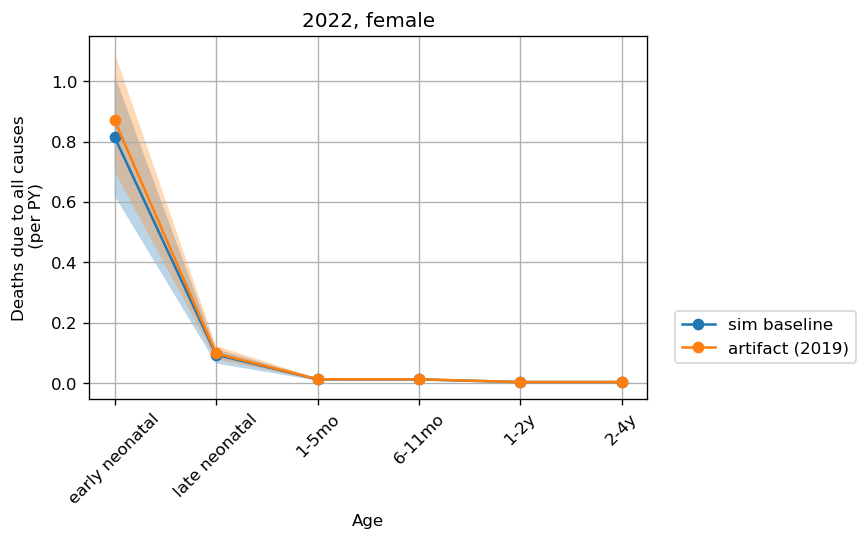

In [99]:
#plot_sim_vs_artifact(sim_data: pd.DataFrame, artifact_data: pd.DataFrame, sim_year: int, art_year: int, sex: str, sim_measure: str):
plot_sim_vs_artifact(acmr, art_acmr, 2022, 2019, 'female', 'acmr')

In [100]:
ls /home/j/Project/simulation_science/ciff_malnutrition/verification_and_validation/v2.1_gbd_2020_wasting

all_cause_mortality.pdf  diarrhea_remission.pdf  lri_remission.pdf
diarrhea_emr.pdf         lri_emr.pdf             measles_emr.pdf
diarrhea_incidence.pdf   lri_incidence.pdf       measles_incidence.pdf
diarrhea_mortality.pdf   lri_mortality.pdf       measles_mortality.pdf
diarrhea_prevalence.pdf  lri_prevalence.pdf      measles_prevalence.pdf


In [101]:
output_dir

'/home/j/Project/simulation_science/ciff_malnutrition/verification_and_validation/v2.3_wasting_birth_prevalence/'

# MORTALITY

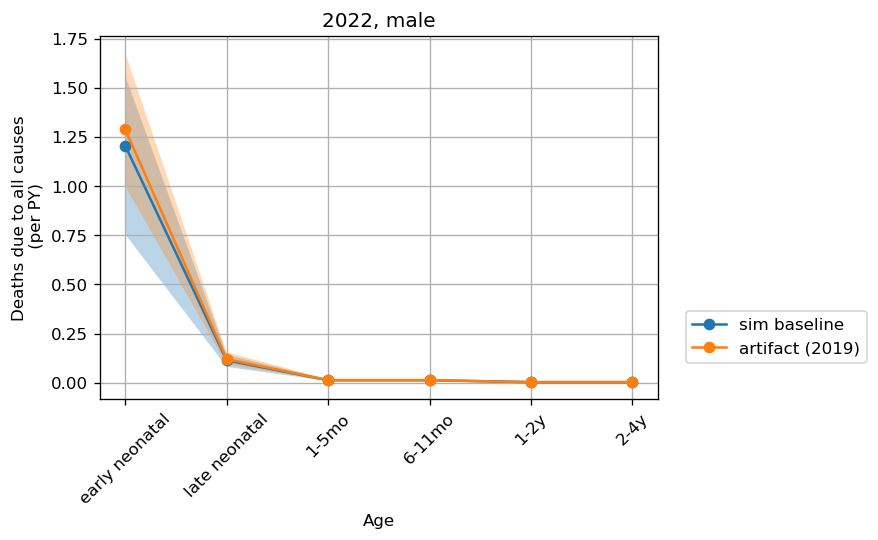

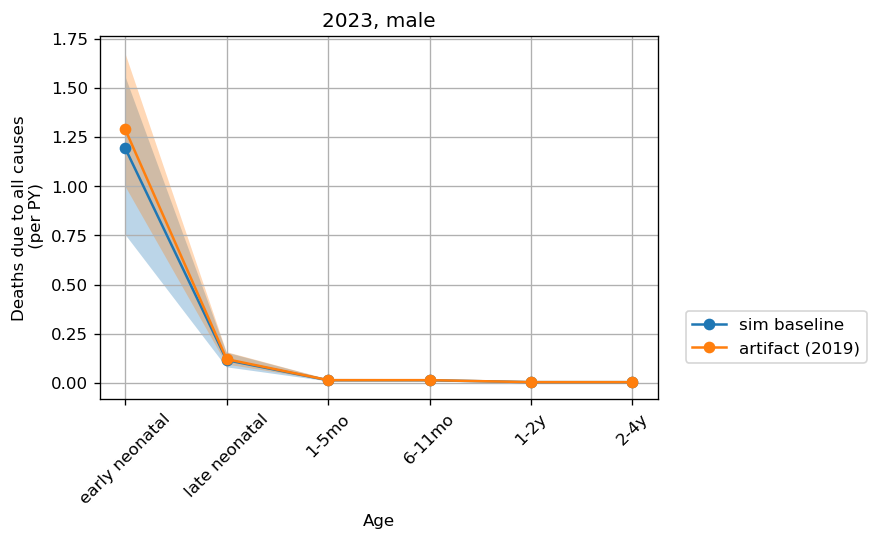

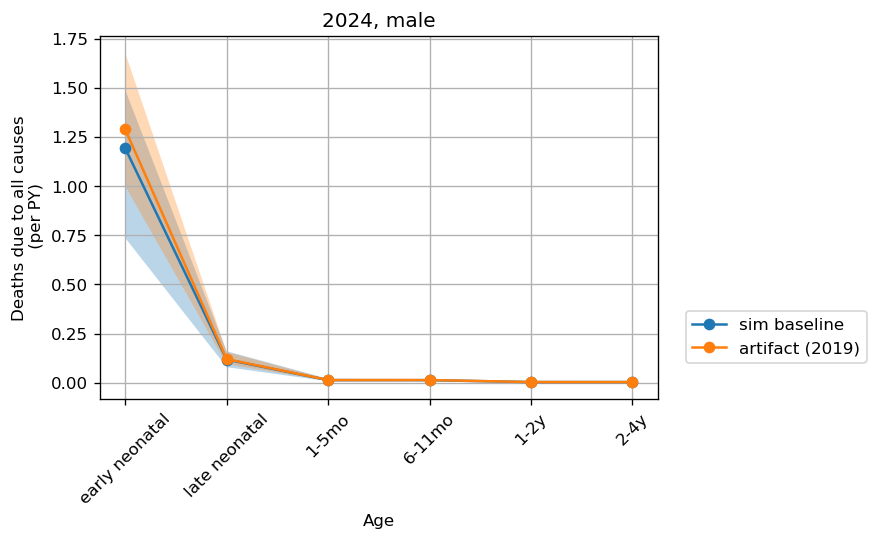

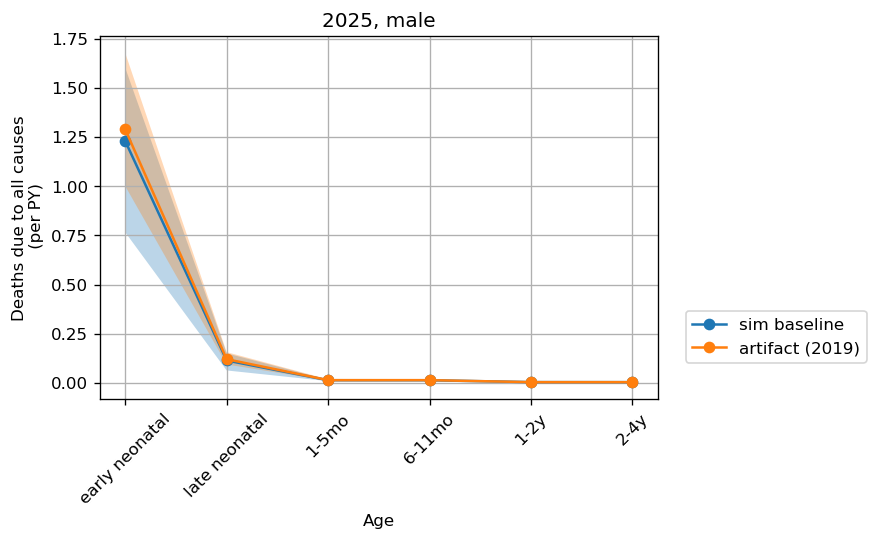

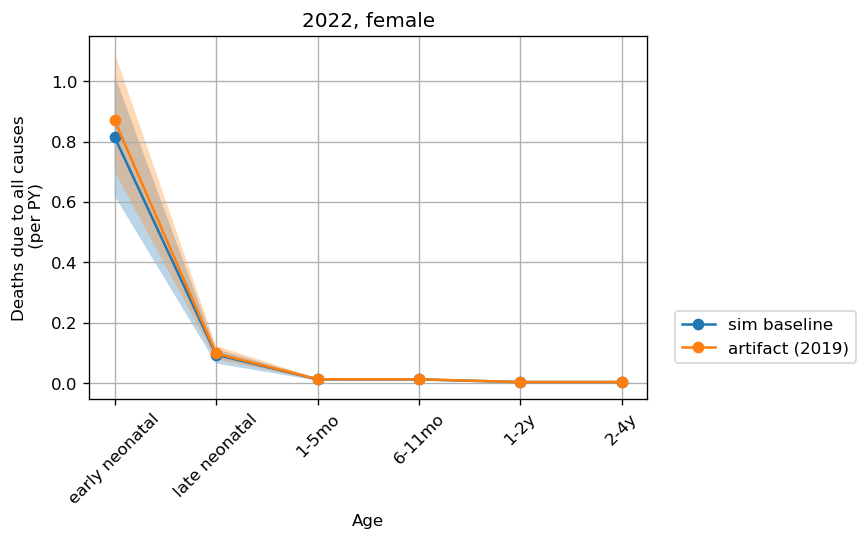

...

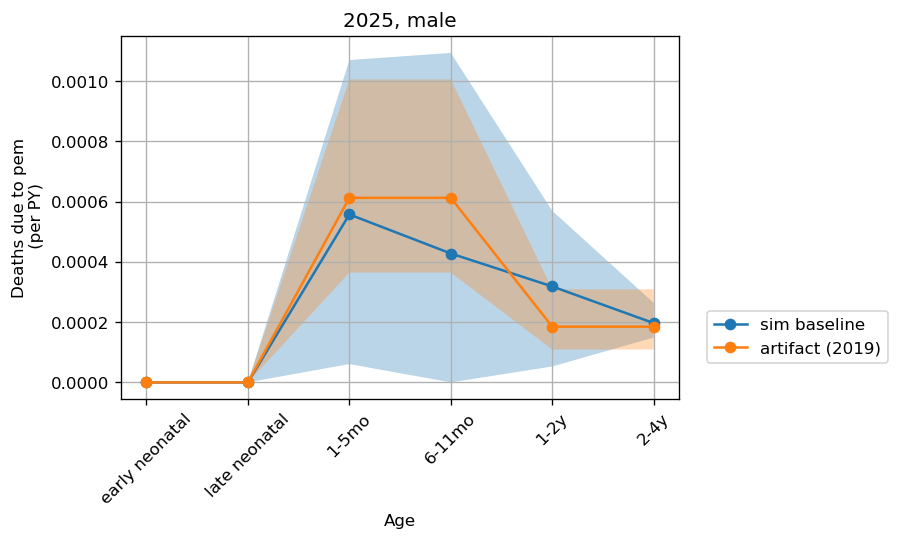

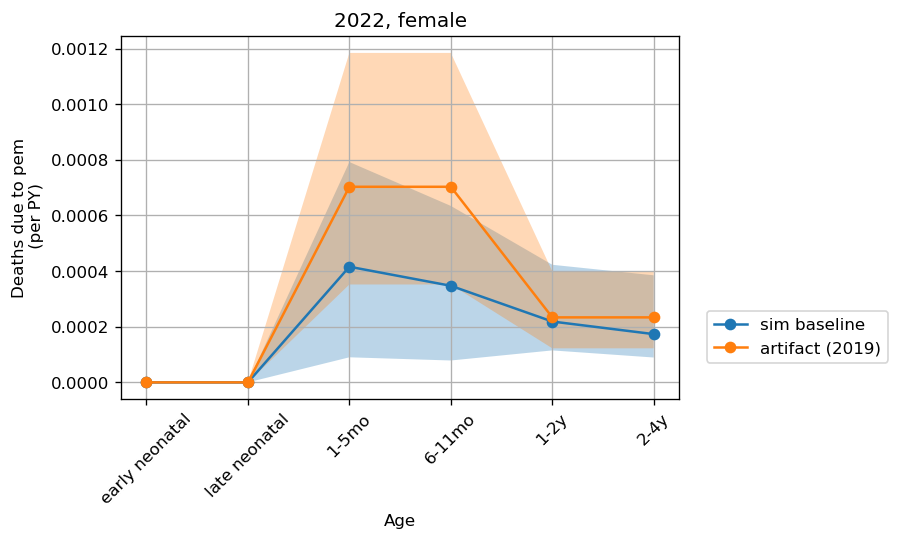

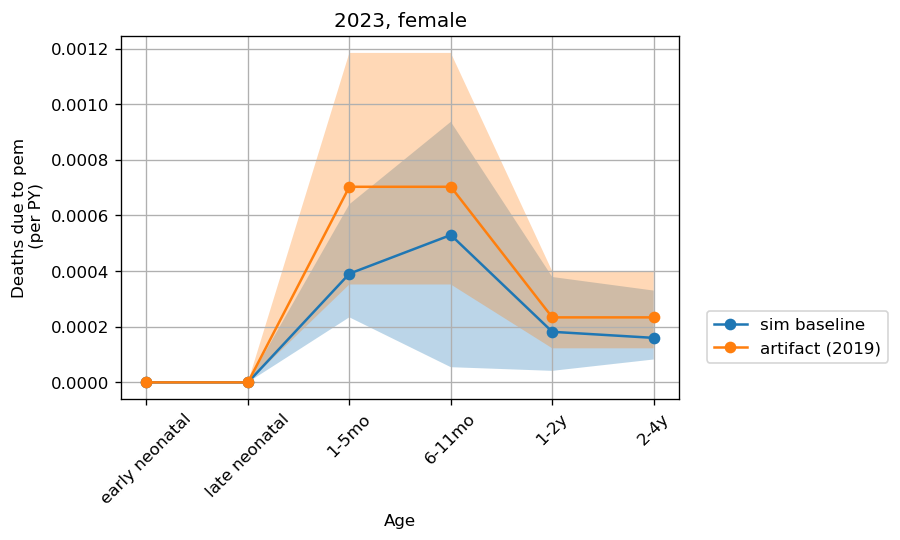

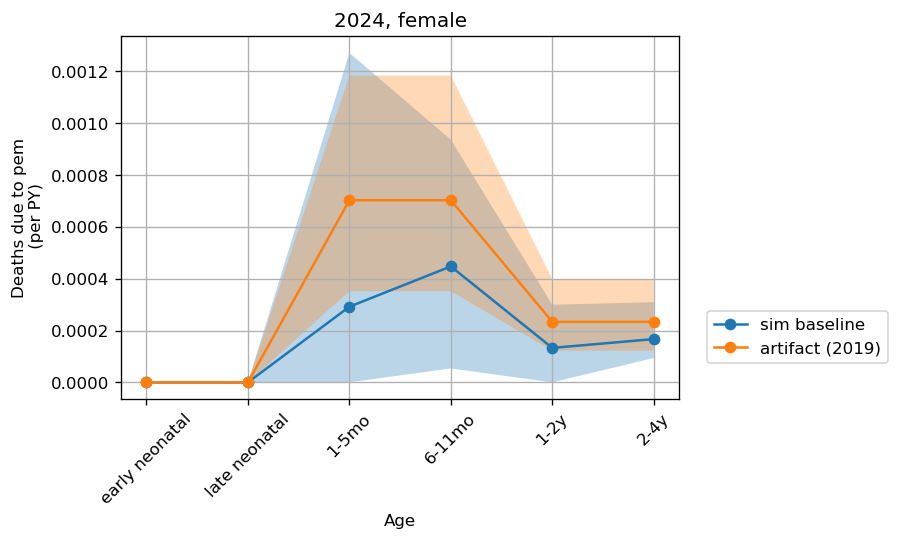

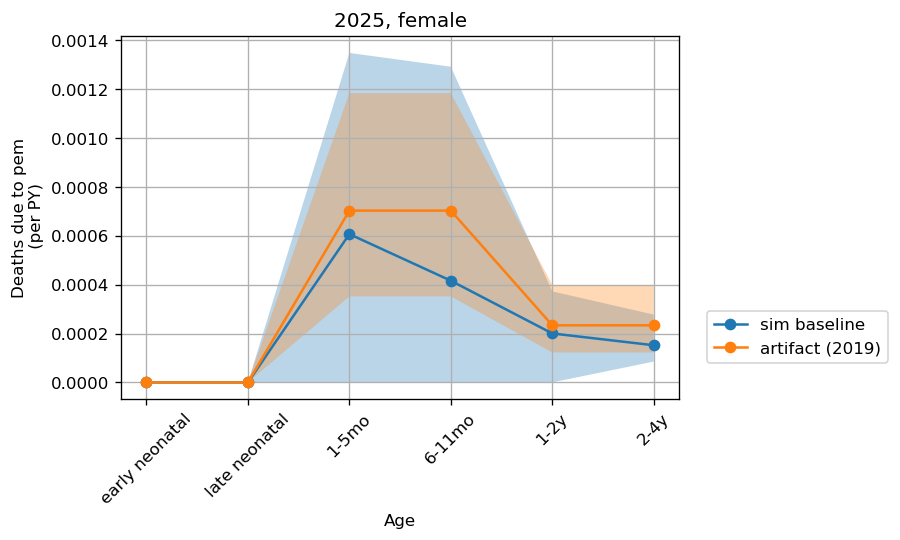

In [102]:
with PdfPages(output_dir + 'all_cause_mortality.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(acmr, art_acmr, sim_year, 2019, sex, 'acmr')
            pdf.savefig(bbox_inches='tight')
    
with PdfPages(output_dir + 'diarrhea_mortality.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(deaths_dd, art_csmr_dd, sim_year, 2019, sex, 'csmr_dd')      
            pdf.savefig(bbox_inches='tight')
    
with PdfPages(output_dir + 'lri_mortality.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(deaths_lri, art_csmr_lri, sim_year, 2019, sex, 'csmr_lri') 
            pdf.savefig(bbox_inches='tight')
    
with PdfPages(output_dir + 'measles_mortality.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(deaths_msls, art_csmr_msls, sim_year, 2019, sex, 'csmr_msls') 
            pdf.savefig(bbox_inches='tight')
            
with PdfPages(output_dir + 'pem_mortality.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(deaths_pem, art_csmr_pem, sim_year, 2019, sex, 'csmr_pem') 
            pdf.savefig(bbox_inches='tight')

# PREVALENCE

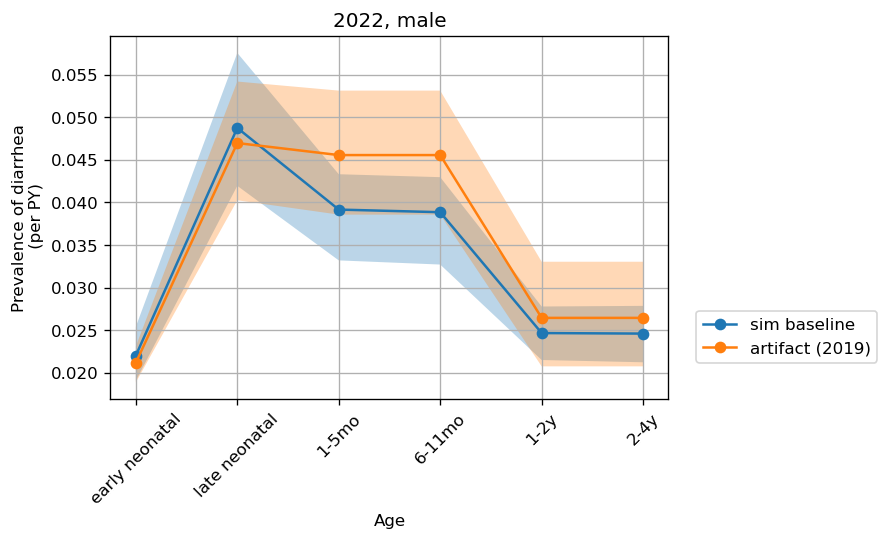

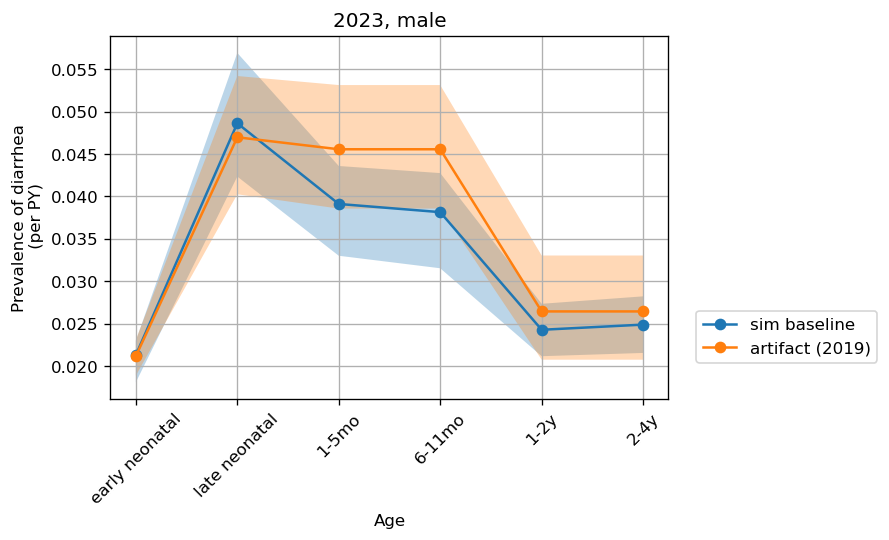

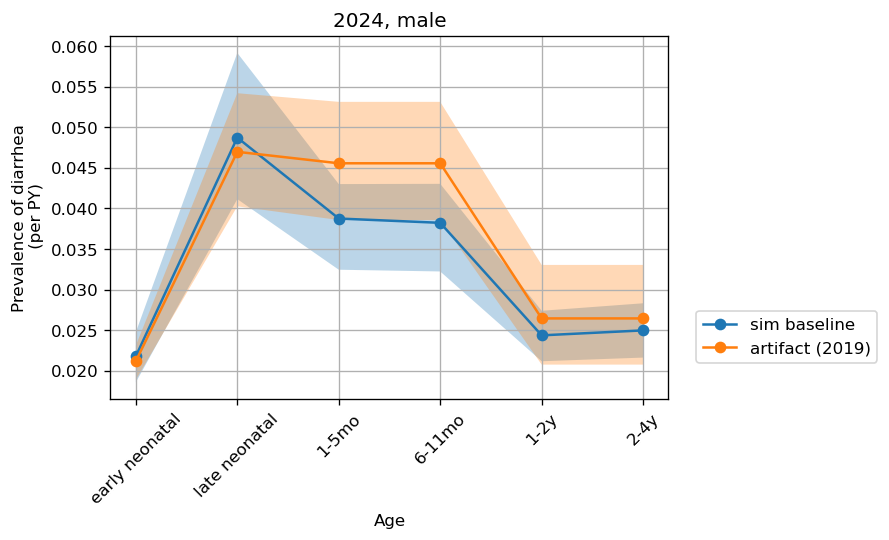

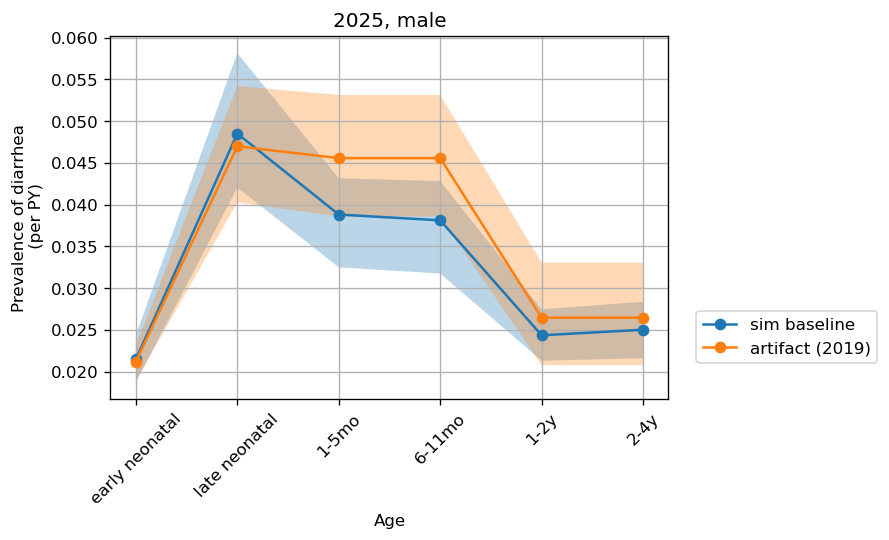

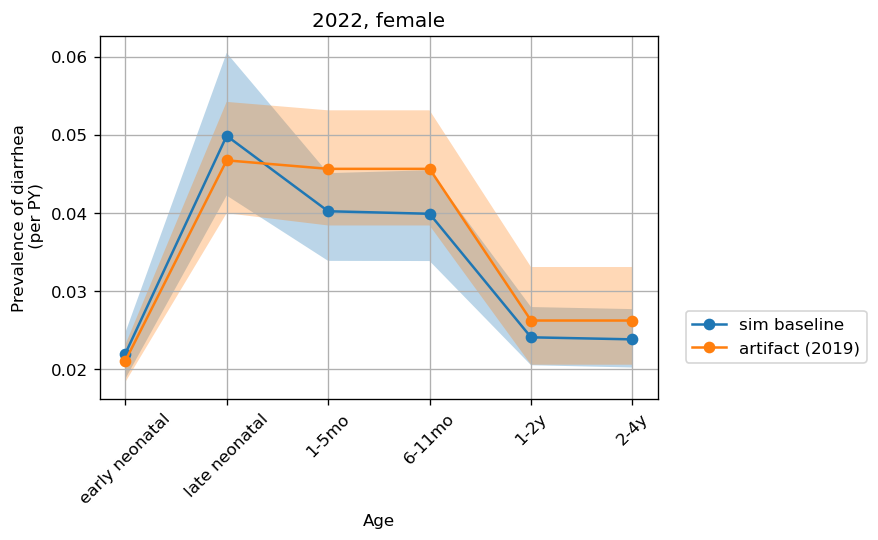

...

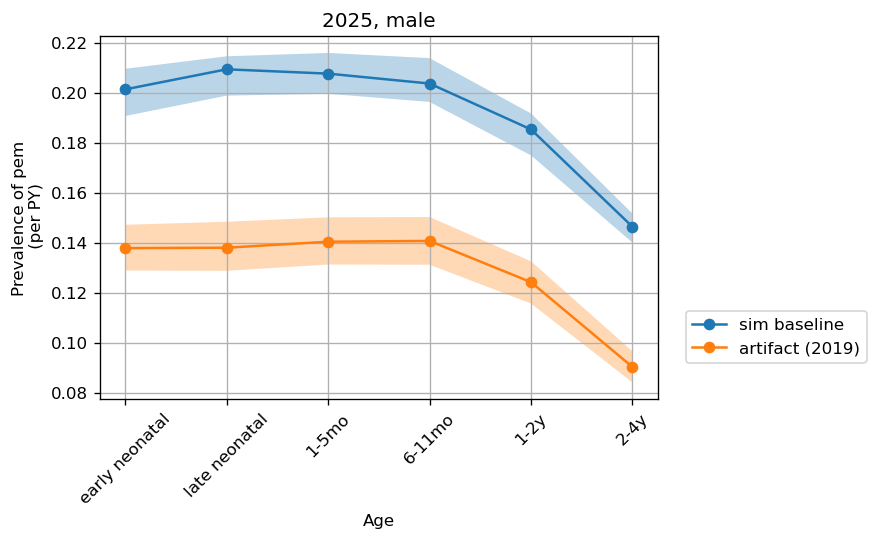

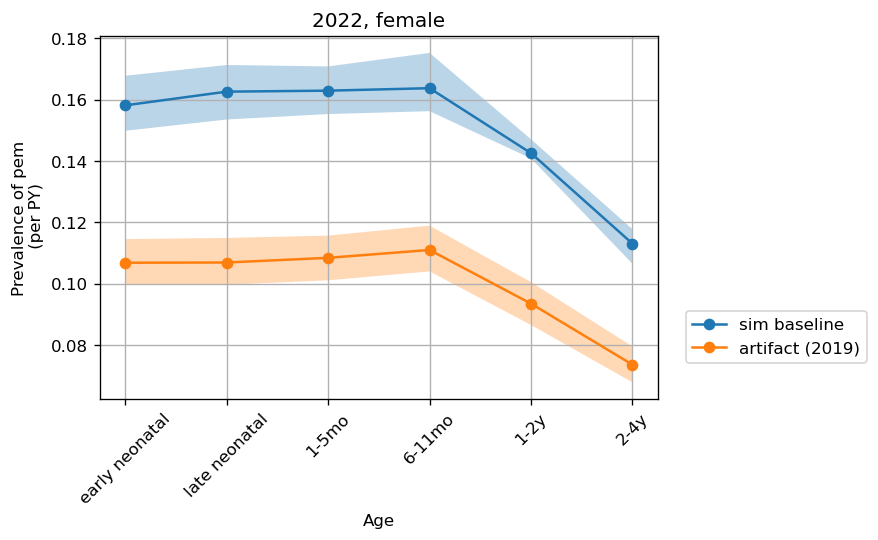

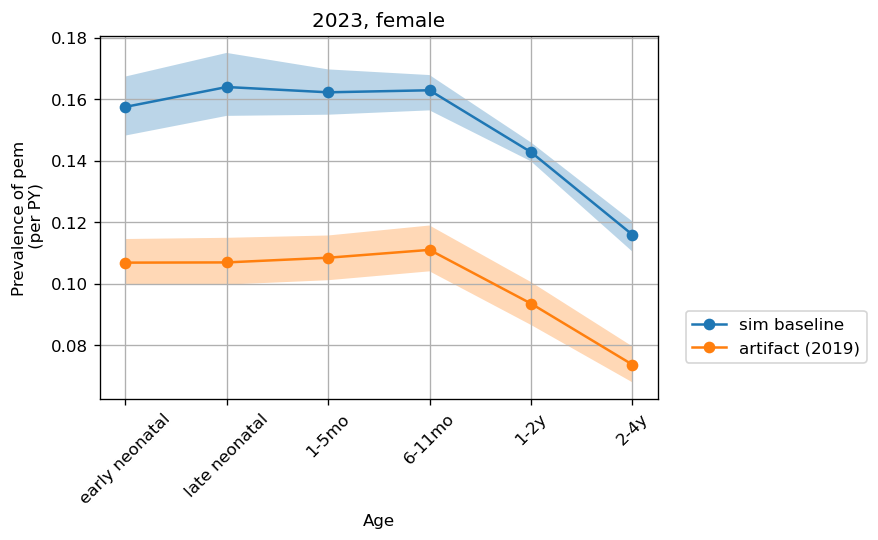

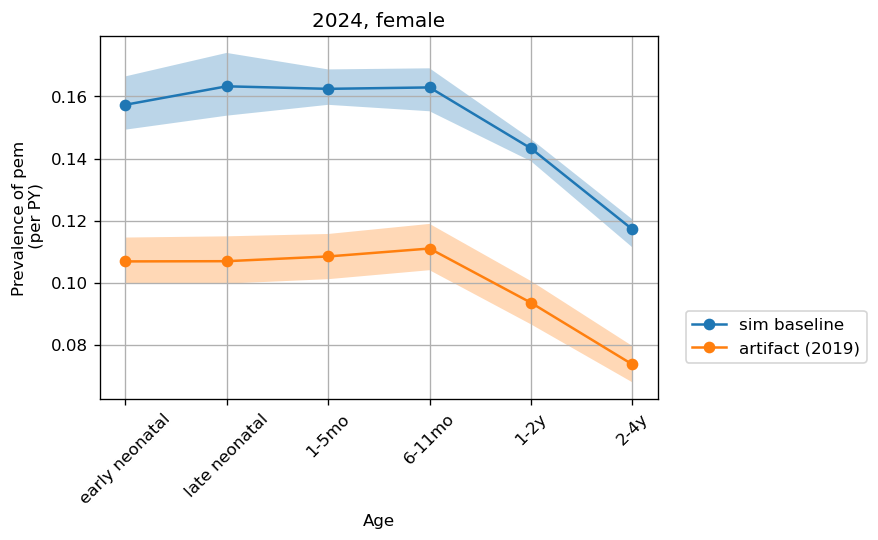

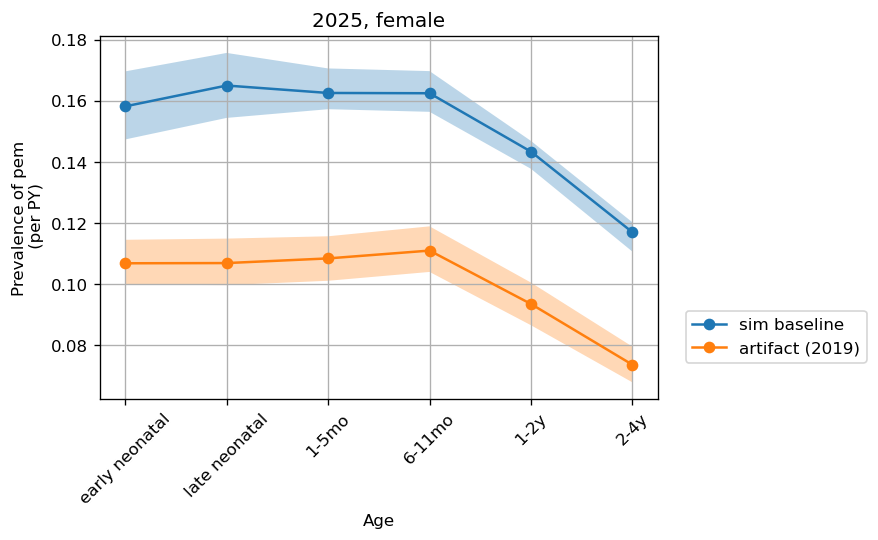

In [103]:
with PdfPages(output_dir + 'diarrhea_prevalence.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(prevalence_dd, art_prevalence_dd, sim_year, 2019, sex, 'prevalence_dd')
            pdf.savefig(bbox_inches='tight')
            
with PdfPages(output_dir + 'lri_prevalence.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(prevalence_lri, art_prevalence_lri, sim_year, 2019, sex, 'prevalence_lri')                
            pdf.savefig(bbox_inches='tight')

with PdfPages(output_dir + 'measles_prevalence.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(prevalence_msls, art_prevalence_msls, sim_year, 2019, sex, 'prevalence_msls')
            pdf.savefig(bbox_inches='tight')

with PdfPages(output_dir + 'pem_prevalence.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(prevalence_pem, art_prevalence_pem, sim_year, 2019, sex, 'prevalence_pem')
            pdf.savefig(bbox_inches='tight')

# INCIDENCE

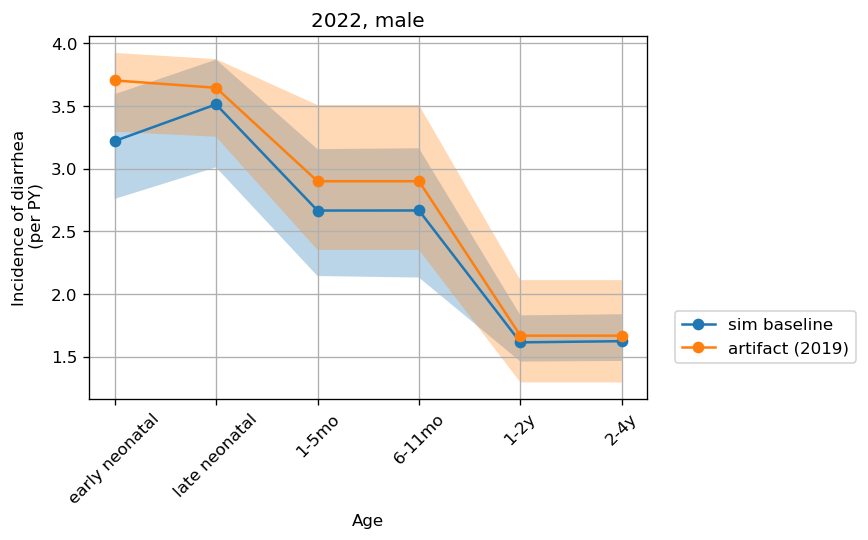

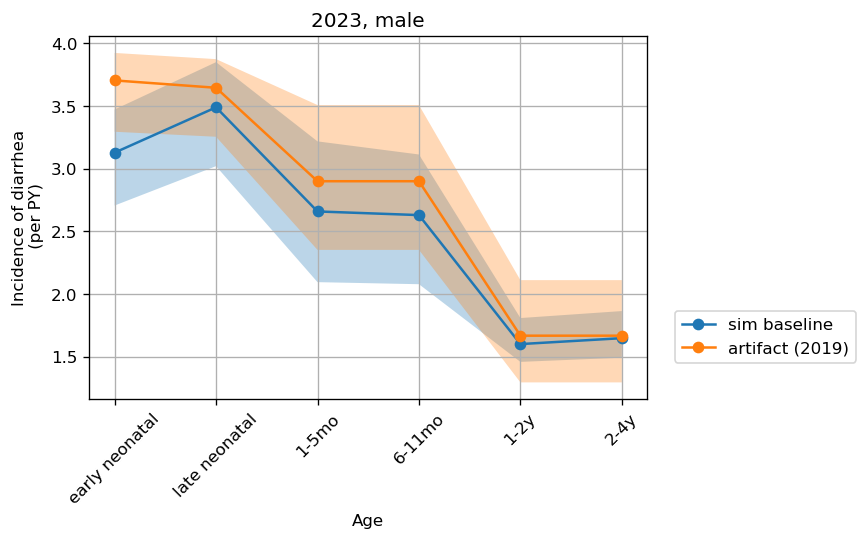

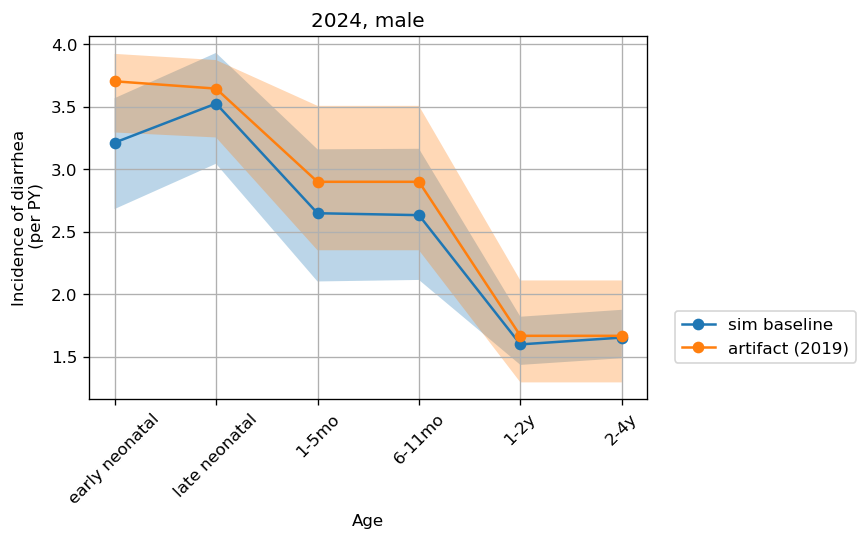

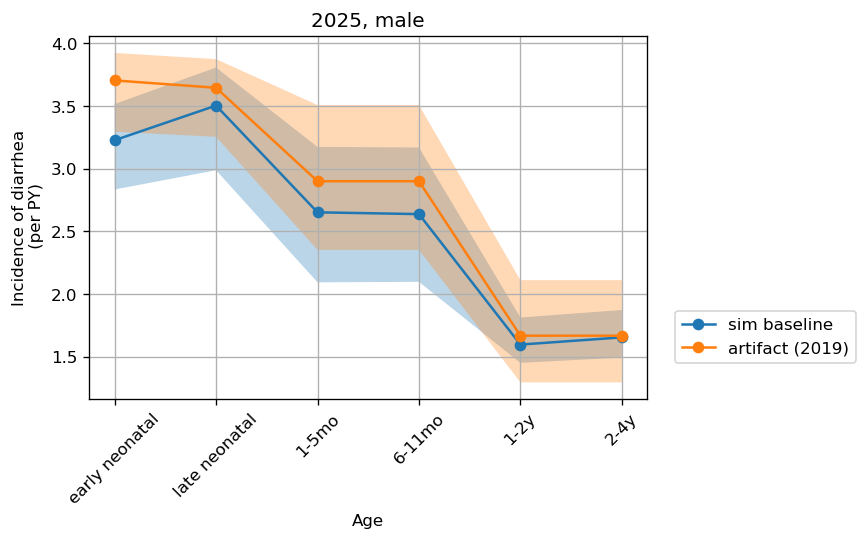

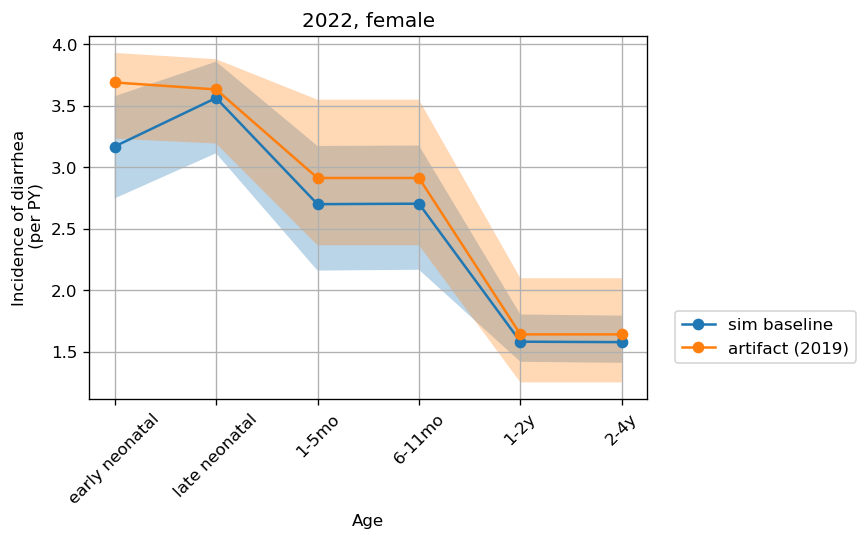

...

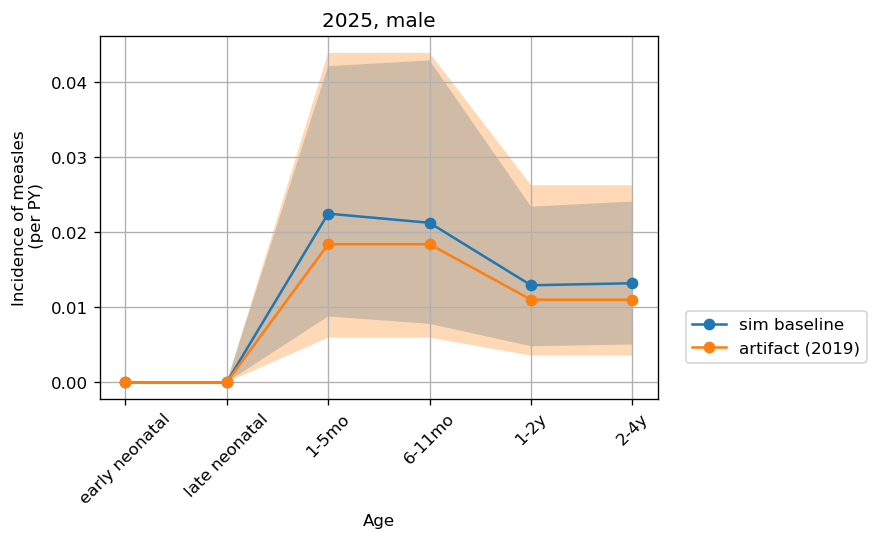

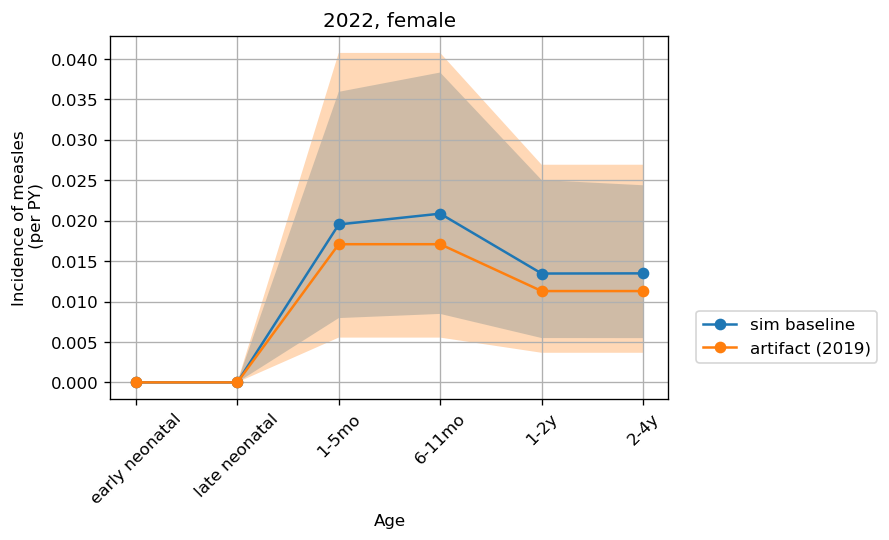

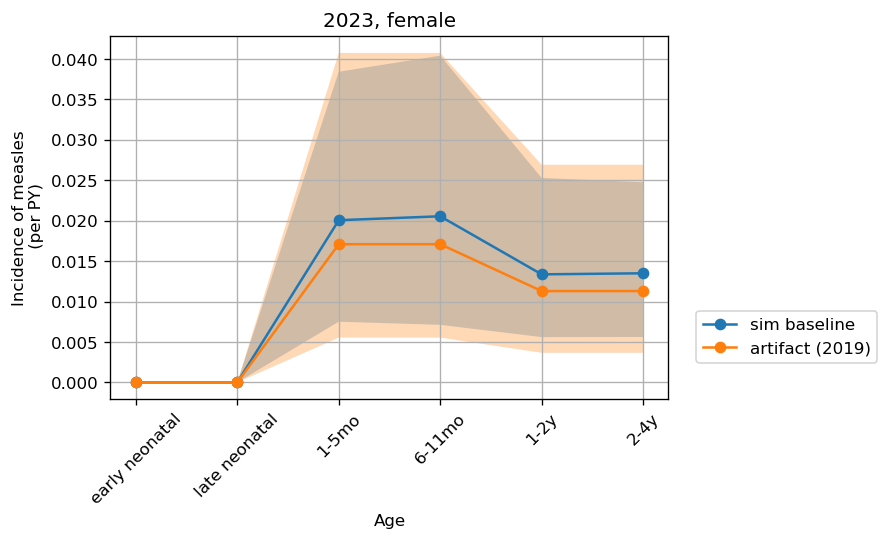

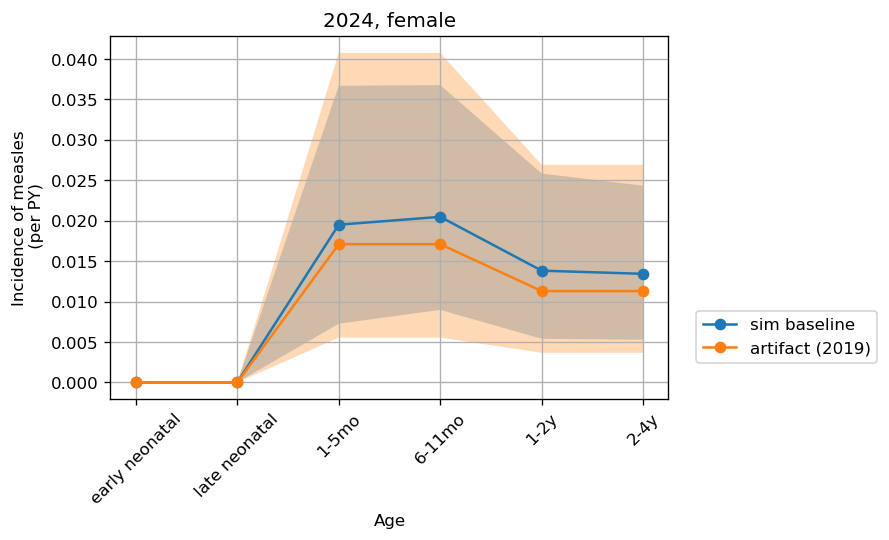

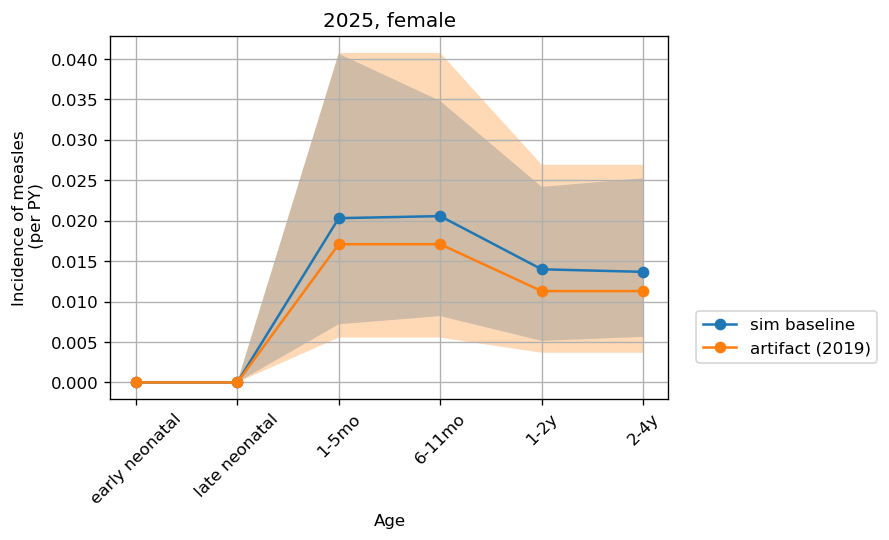

In [104]:
with PdfPages(output_dir + 'diarrhea_incidence.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(incidence_dd, art_incidence_dd, sim_year, 2019, sex, 'incidence_dd')           
            pdf.savefig(bbox_inches='tight')
            
with PdfPages(output_dir + 'lri_incidence.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(incidence_lri, art_incidence_lri, sim_year, 2019, sex, 'incidence_lri')
            pdf.savefig(bbox_inches='tight')
            
            
with PdfPages(output_dir + 'measles_incidence.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(incidence_msls, art_incidence_msls, sim_year, 2019, sex, 'incidence_msls')
            pdf.savefig(bbox_inches='tight')

# REMISSION

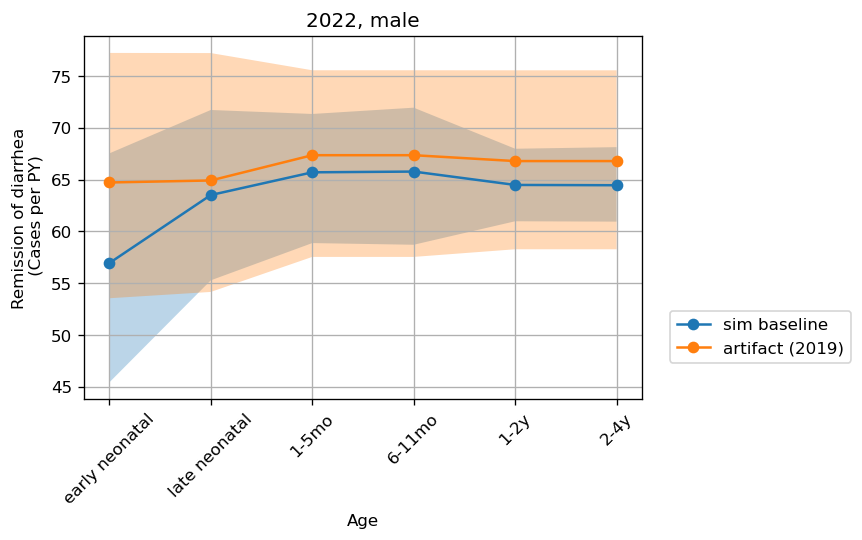

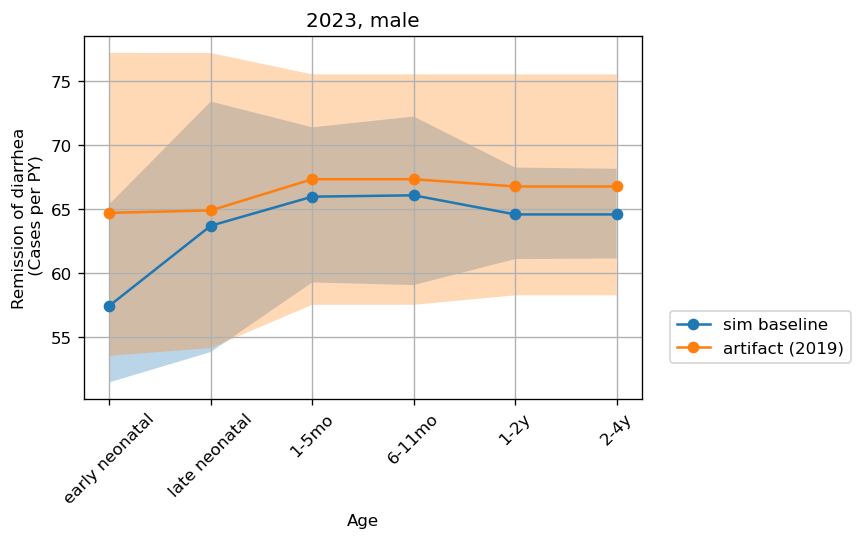

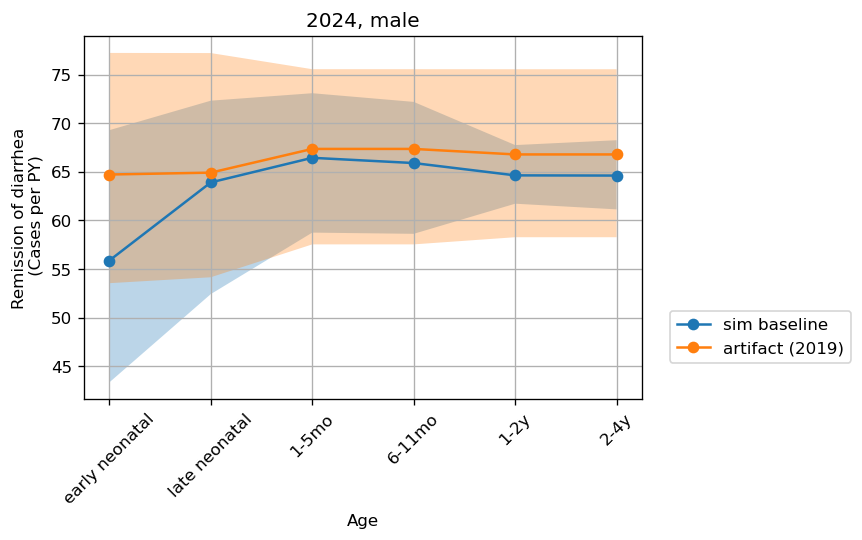

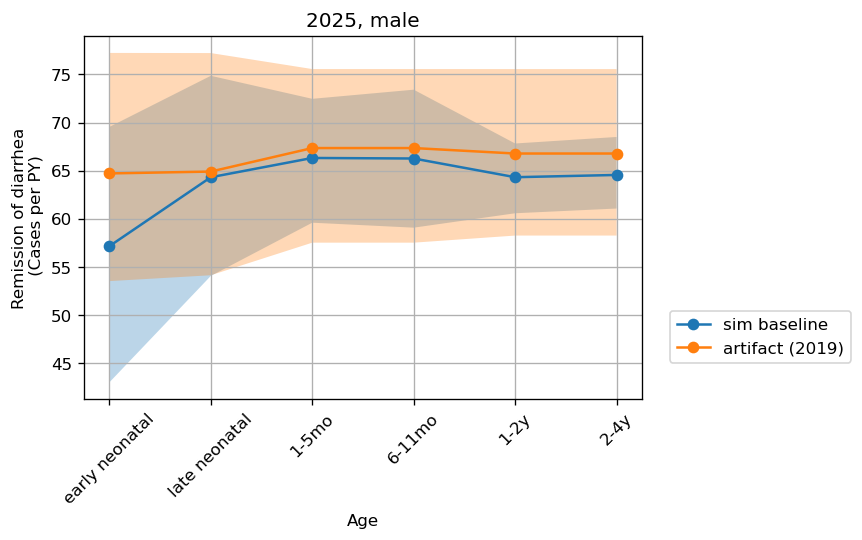

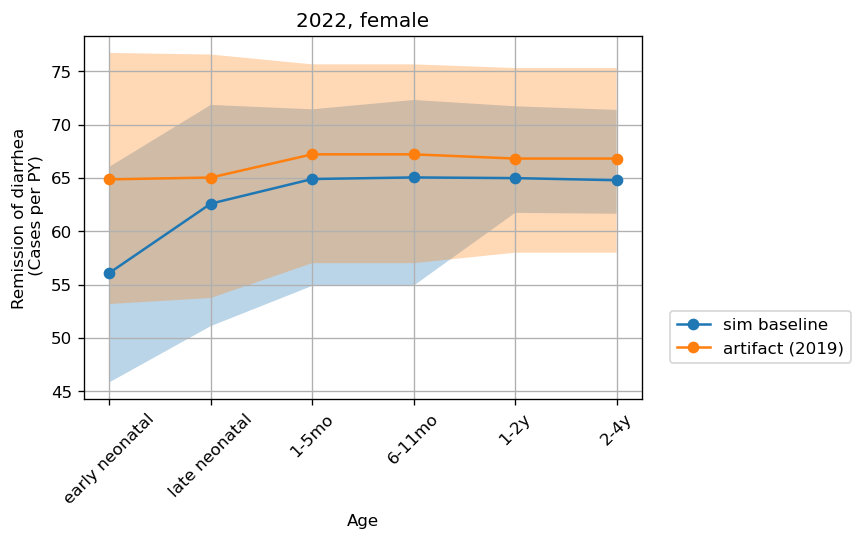

...

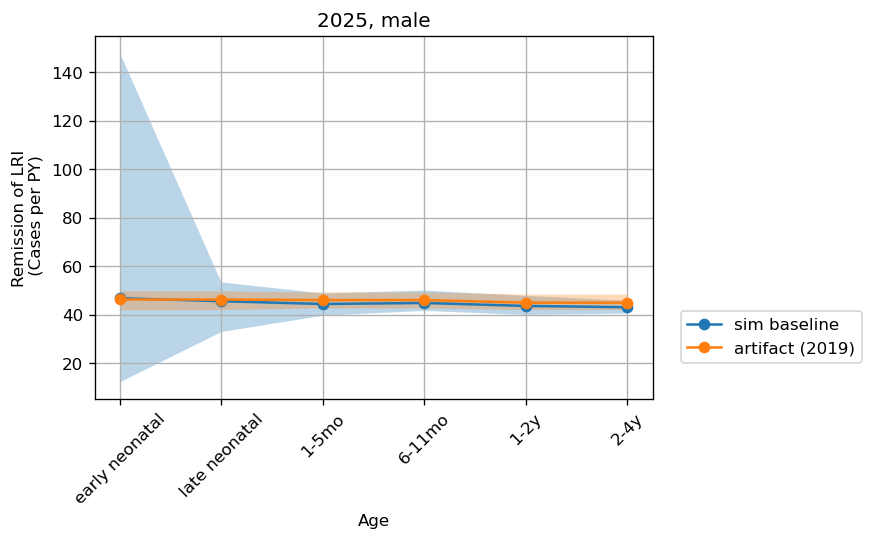

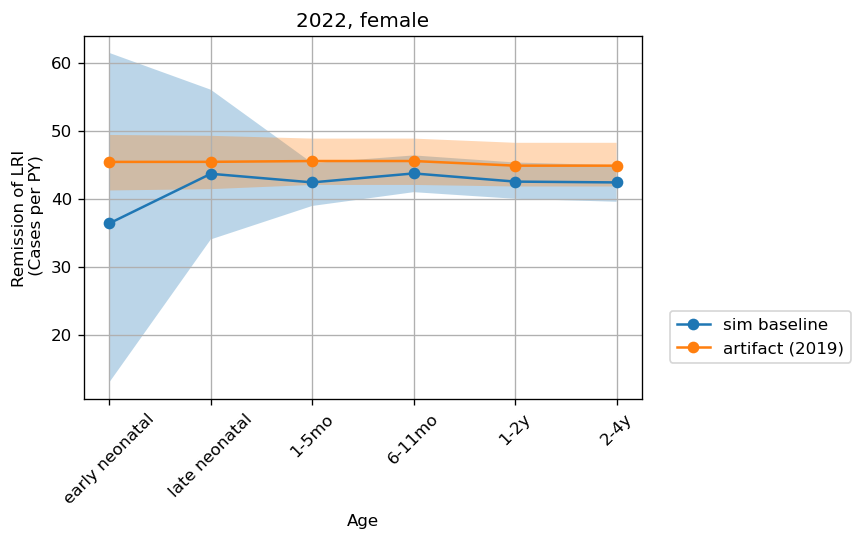

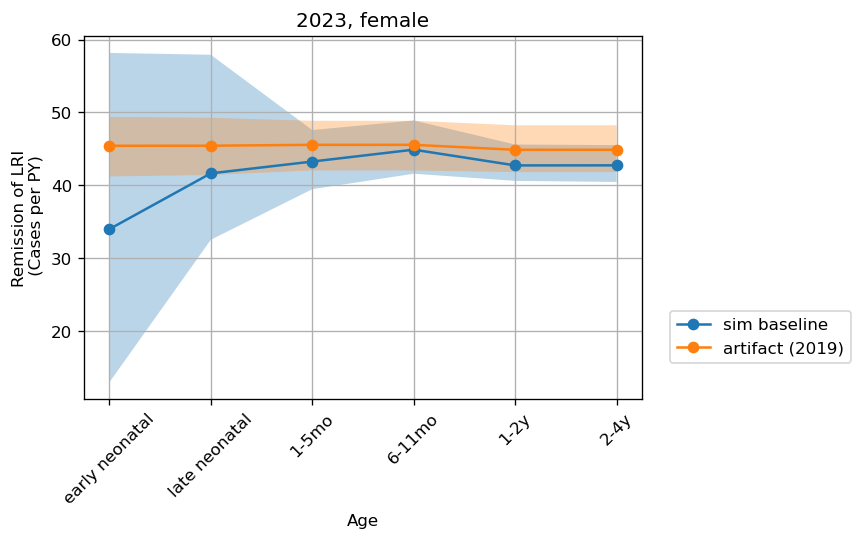

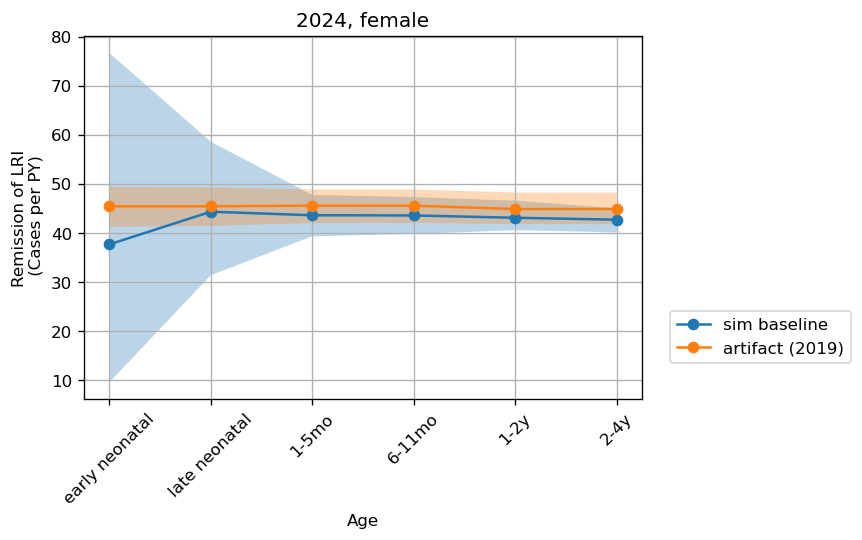

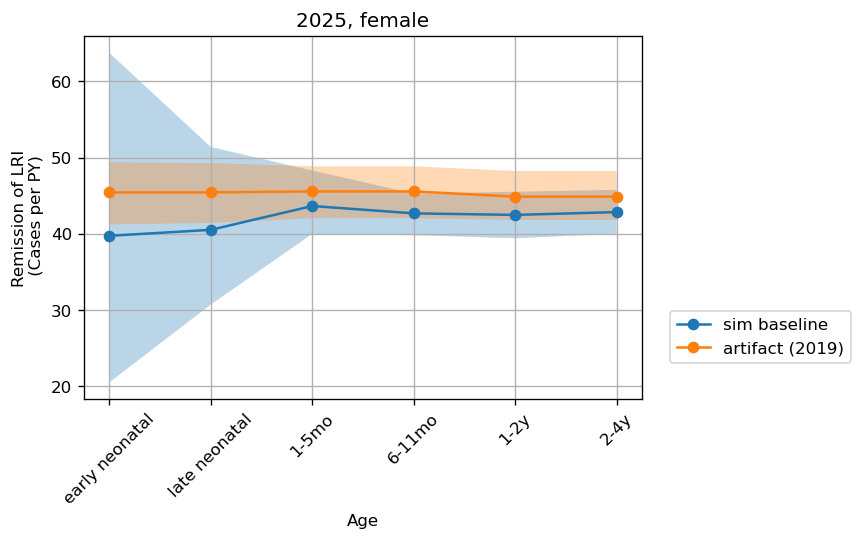

In [105]:
with PdfPages(output_dir + 'diarrhea_remission.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(remission_dd, art_remission_dd, sim_year, 2019, sex, 'remission_dd')
            pdf.savefig(bbox_inches='tight')
            
with PdfPages(output_dir + 'lri_remission.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(remission_lri, art_remission_lri, sim_year, 2019, sex, 'remission_lri')            
            pdf.savefig(bbox_inches='tight')
            
# with PdfPages(output_dir + 'measles_remission.pdf') as pdf:
#     for sex in ['male', 'female']:
#         for sim_year in range(2022, 2026):
#             plot_sim_vs_artifact(remission_msls, art_remission_msls, sim_year, 2019, sex, 'remission_msls')
#             pdf.savefig(bbox_inches='tight')

# EXCESS MORTALITY

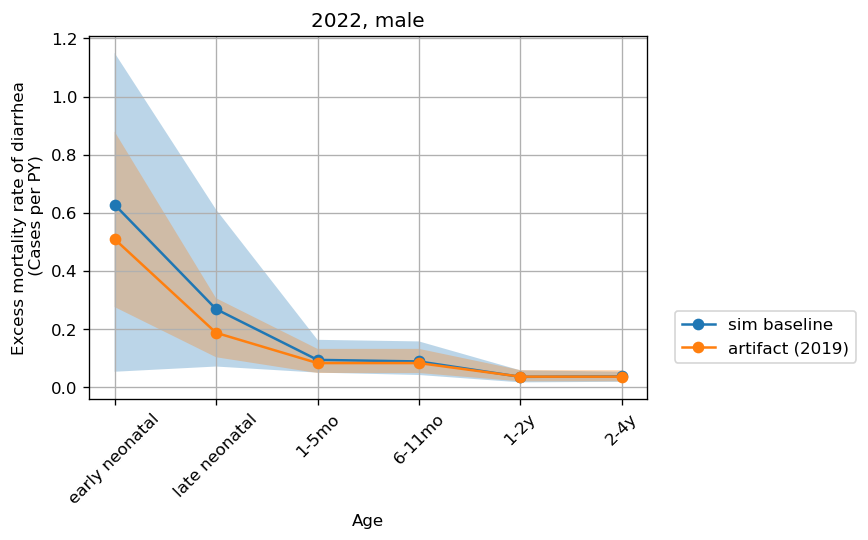

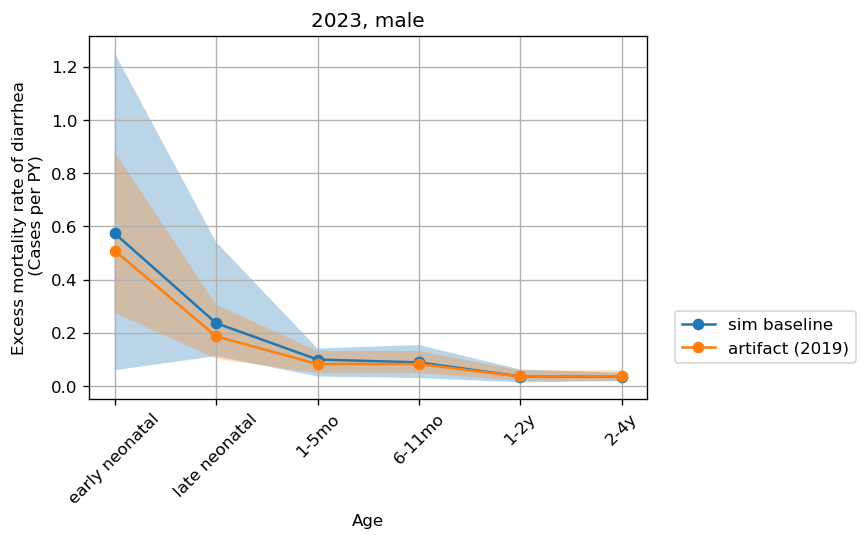

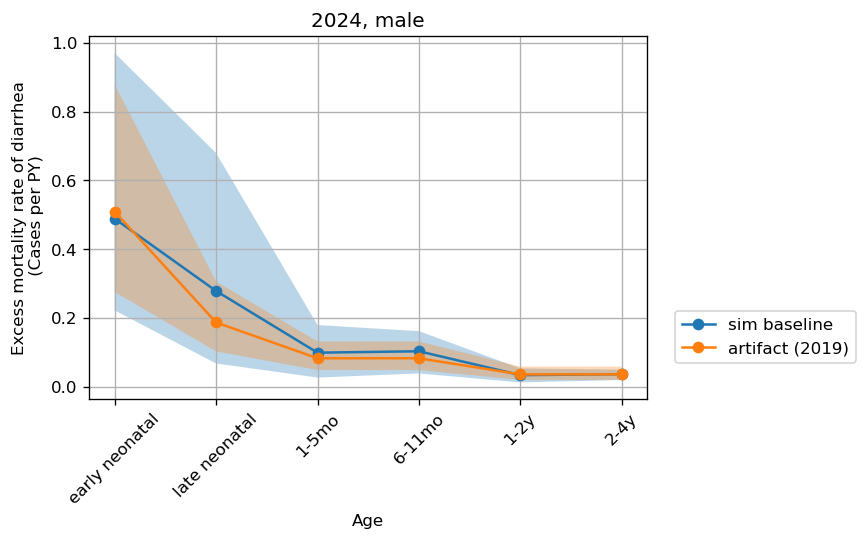

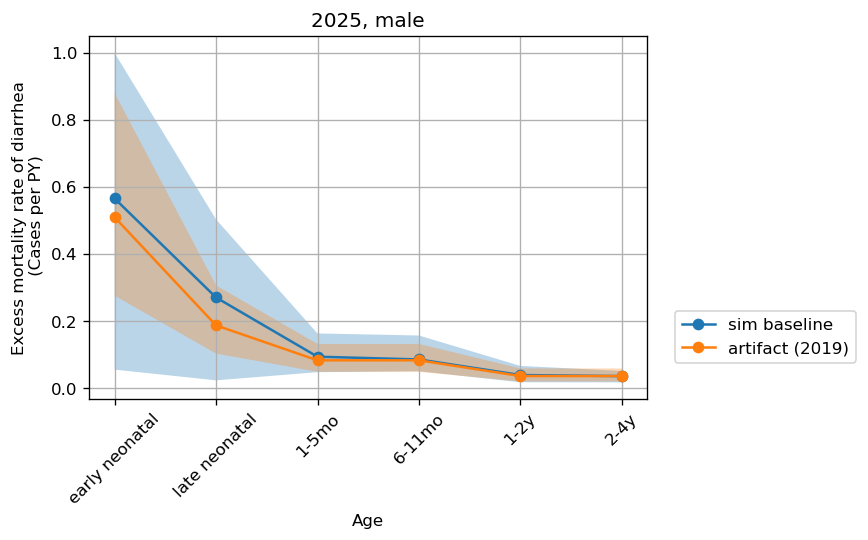

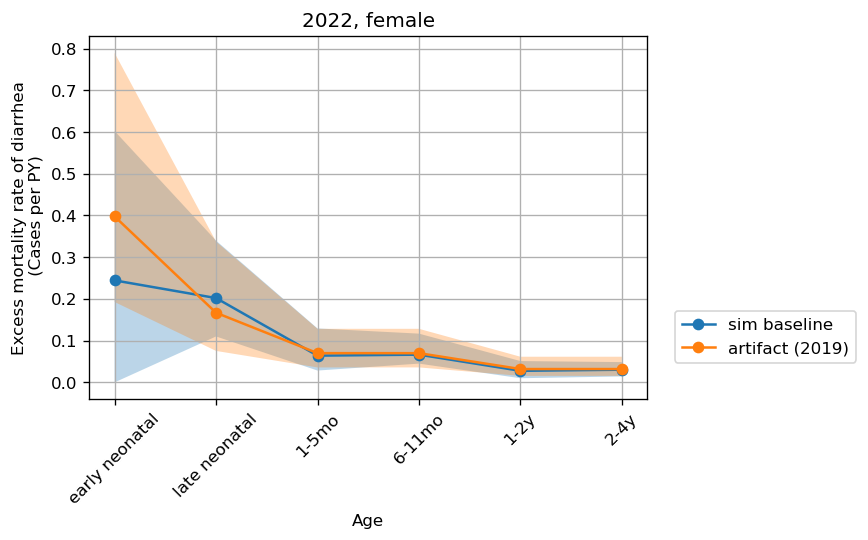

...

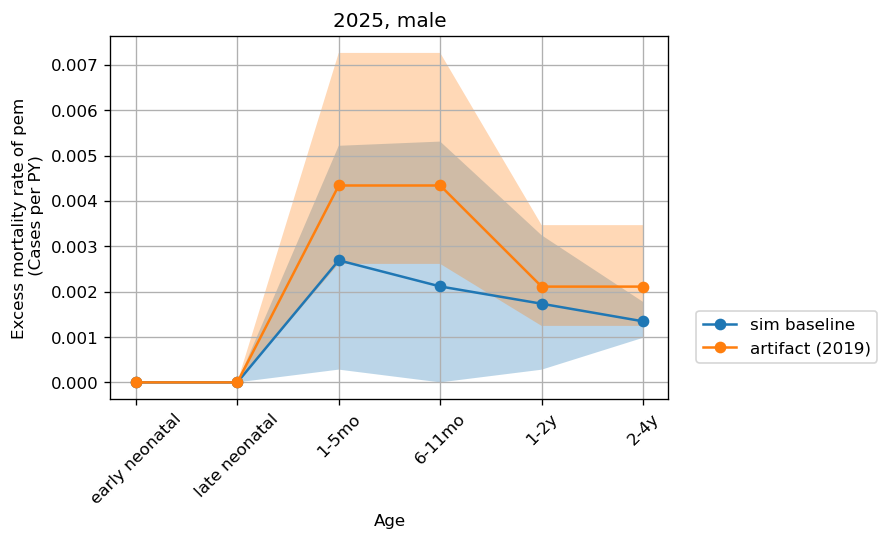

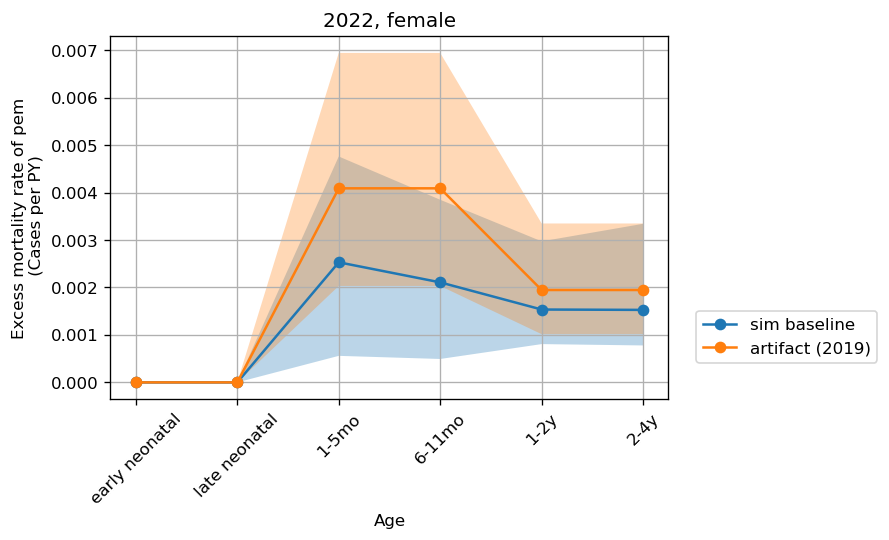

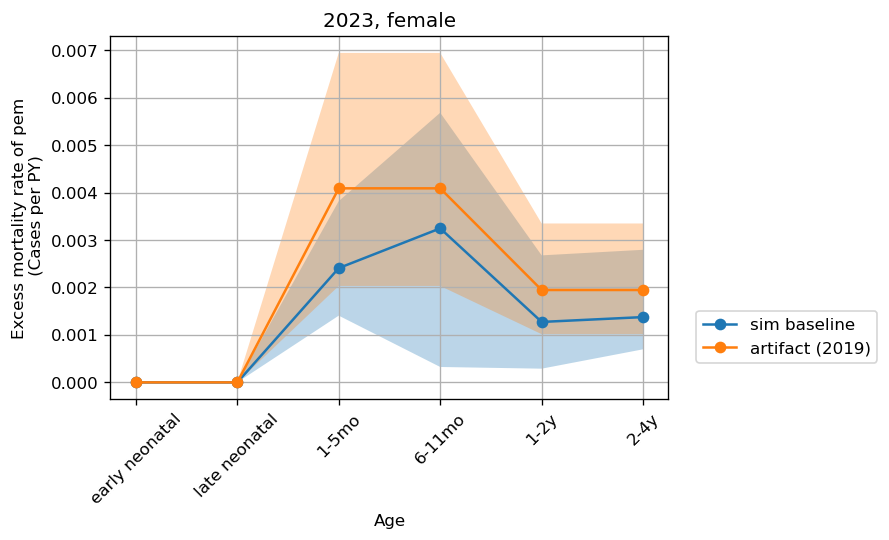

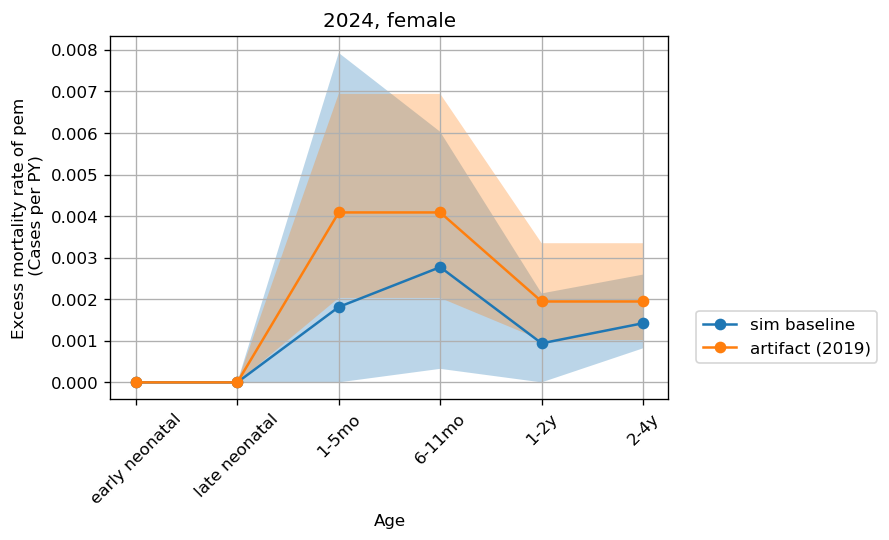

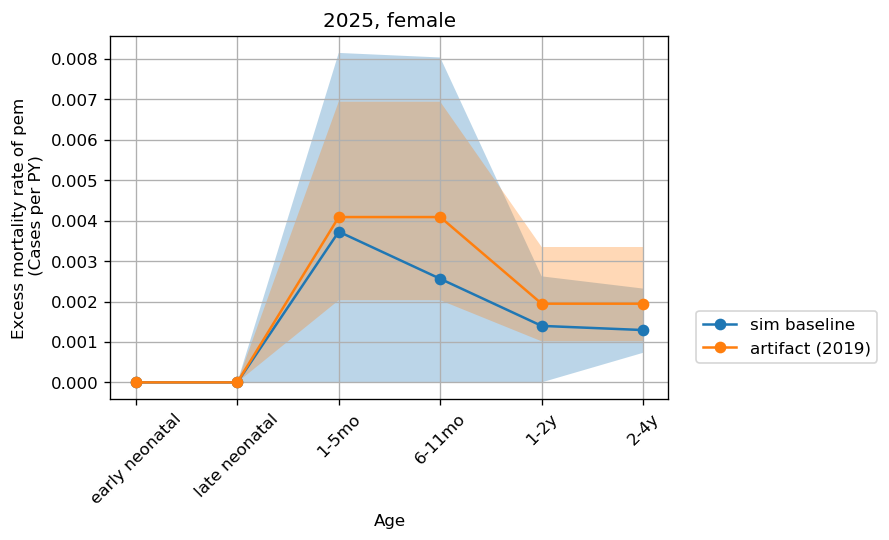

In [108]:
with PdfPages(output_dir + 'diarrhea_emr.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(emr_dd, art_emr_dd, sim_year, 2019, sex, 'emr_dd')    
            pdf.savefig(bbox_inches='tight')
            
with PdfPages(output_dir + 'lri_emr.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(emr_lri, art_emr_lri, sim_year, 2019, sex, 'emr_lri')      
            pdf.savefig(bbox_inches='tight')
            
with PdfPages(output_dir + 'measles_emr.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(emr_msls, art_emr_msls, sim_year, 2019, sex, 'emr_msls')        
            pdf.savefig(bbox_inches='tight')
            
with PdfPages(output_dir + 'pem_emr.pdf') as pdf:
    for sex in ['male', 'female']:
        for sim_year in range(2022, 2026):
            plot_sim_vs_artifact(emr_pem, art_emr_pem, sim_year, 2019, sex, 'emr_pem')        
            pdf.savefig(bbox_inches='tight')

================================== END ==============================================